## Initializing

In [2]:
# Imports
import os, pickle, torch
import matplotlib.pyplot as plt
from tqdm import tqdm
from transformers import AutoModelForCausalLM, AutoTokenizer, TextIteratorStreamer
import matplotlib.colors as pltc
import numpy as np
LOCATION = '/igli/raw_logits_v2/'
device = 'cuda:1'

In [25]:
token_id = 2167
file_no=0
start_file = 0
nfiles = 1000

In [26]:
id1 = np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_id_gt"), dtype=np.int32).reshape(1000, 1024)
tid1 = np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_id_t"), dtype=np.int32).reshape(1000, 1024, 100)

In [27]:
index = np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_{token_id}_index"), dtype=np.int16).reshape(-1, 2)

In [32]:
np.logical_or(id1 == token_id, (tid1[...,:10] == token_id).any(axis=-1)).nonzero()[0].shape

(6540,)

In [23]:
(id1 == token_id).nonzero()[0][:10]

array([ 0,  3,  6,  8, 13, 13, 18, 18, 18, 18])

In [31]:
index.shape

(6540, 2)

In [54]:
l_emb = list(range(1000))
l_s_prob = list(range(1000))
l_t_prob = list(range(1000))
for file_no in tqdm(range(start_file, min(1000, start_file + nfiles))):
    index = np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_{token_id}_index"), dtype=np.int16).reshape(-1, 2)
    l_emb[file_no] = (np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_{token_id}_student_embeddings"), dtype=np.float16).reshape(-1, 2048))
    l_s_prob[file_no] = (np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_{token_id}_student_probs"), dtype=np.float16).reshape(-1, 100))
    TL = np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_logit_t"), dtype=np.float16).reshape(1000,1024,100)[index[:, 0], index[:, 1]]
    l_t_prob[file_no] = (TL)

 10%|████                                    | 101/1000 [04:22<38:53,  2.60s/it]


KeyboardInterrupt: 

In [219]:
l_t_prob[5][::100].

(68, 100)

In [117]:
gt_ids = list(range(100))
t_ids = list(range(100))


In [118]:
for file_no in tqdm(range(start_file, 100)):
    index = np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_{token_id}_index"), dtype=np.int16).reshape(-1, 2)
    ID = (np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_id_gt"), dtype=np.int32).reshape(1000, 1024))    [index[:, 0], index[:, 1]]
    gt_ids[file_no] = ID
    
    T_ID = np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_id_t"), dtype=np.int32).reshape(1000, 1024, 100)[index[:, 0], index[:, 1]]
    t_ids[file_no] = (T_ID)
    
    TL = np.fromfile(os.path.join(LOCATION, f"{file_no:04d}_logit_t"), dtype=np.float16).reshape(1000,1024,100)[index[:, 0], index[:, 1]]
    l_t_prob[file_no] = (TL)

100%|█████████████████████████████████████████| 100/100 [07:40<00:00,  4.61s/it]


In [220]:
np.concatenate(l_t_prob[:7]).shape, np.concatenate(l_t_prob[:6]).shape

((46684, 100), (40077, 100))

In [221]:
46684 - 40077

6607

In [126]:
prob_filter = (np.concatenate(t_ids) == token_id)

In [130]:
not_in_top10 = (~prob_filter.any(axis=1)).nonzero()

In [139]:
(np.concatenate(gt_ids)[not_in_top10] == token_id).all()

True

In [133]:
not_in_top10[0].shape

(1329,)

In [142]:
prob_filter.nonzero()

(array([     0,      1,      2, ..., 661618, 661619, 661620]),
 array([1, 4, 7, ..., 8, 8, 4]))

In [135]:
prob_filter.nonzero()[0].shape

(660292,)

In [136]:
probabilities = np.zeros((661621,))

In [144]:
def softmax(x):
    exped = np.exp(x)
    return exped / np.sum(exped, axis=-1, keepdims=True)

In [151]:
prob_indices = prob_filter.nonzero()
teacher_probs = torch.softmax(torch.tensor(np.concatenate(l_t_prob[:100])), dim=-1)

probabilities[prob_indices[0]] = teacher_probs[prob_indices[0], prob_indices[1]]

In [228]:
probabilities[40077: 46684][::100][55]

0.99951171875

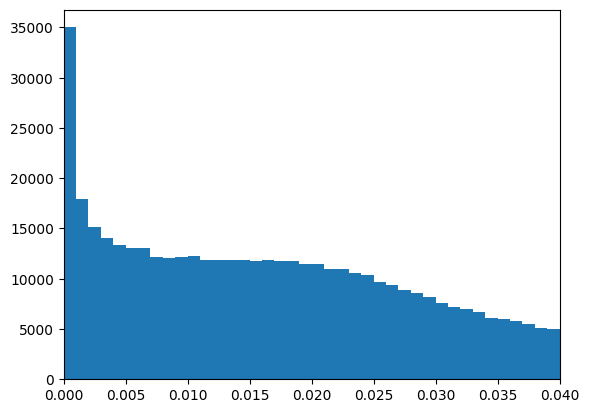

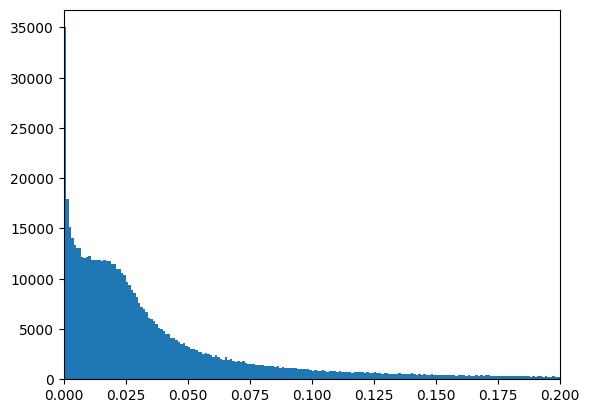

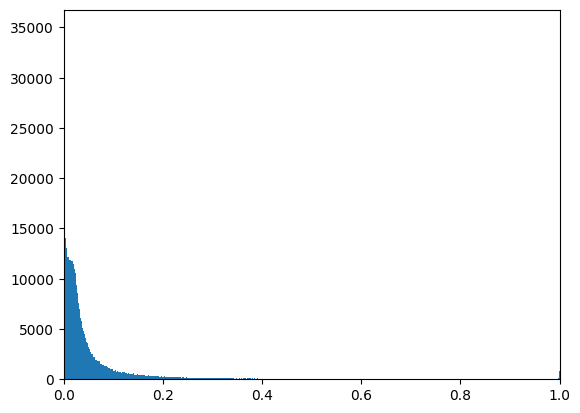

In [166]:
plt.figure()
plt.xlim(0, 0.04)
plt.hist(probabilities, bins = 1000);
plt.figure()
plt.xlim(0,0.2)
plt.hist(probabilities, bins = 1000);
plt.figure()
plt.xlim(0,1)
plt.hist(probabilities, bins = 1000);

In [190]:
from matplotlib.colors import LogNorm
import matplotlib

In [191]:
matplotlib.scale.get_scale_names()

['asinh', 'function', 'functionlog', 'linear', 'log', 'logit', 'symlog']

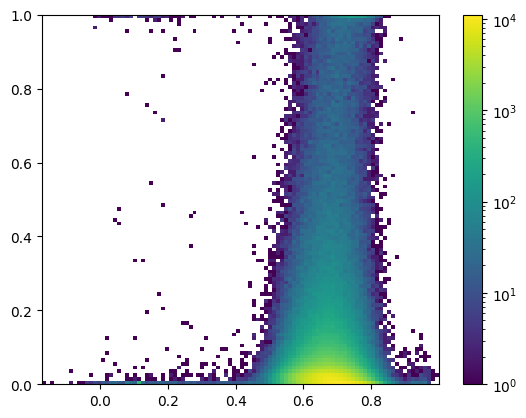

In [195]:
plt.hist2d(allc[:, 0], probabilities, bins=100, norm='log');
plt.colorbar()

In [207]:
prob_filter.shape

(661621, 100)

In [208]:
gt_hits = (np.concatenate(gt_ids) == token_id).nonzero()[0]

In [212]:
gt_hit_ranks = prob_filter[gt_hits].nonzero()[1]

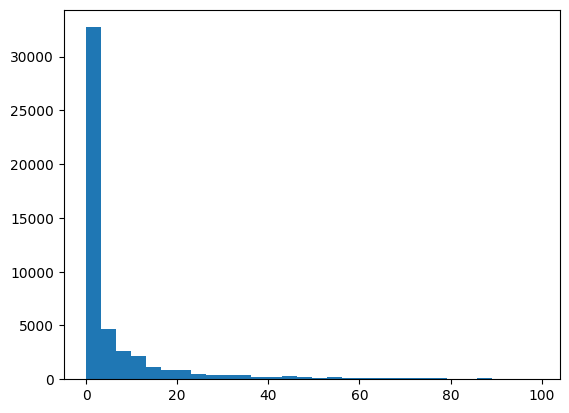

In [215]:
plt.hist(gt_hit_ranks, bins=30);

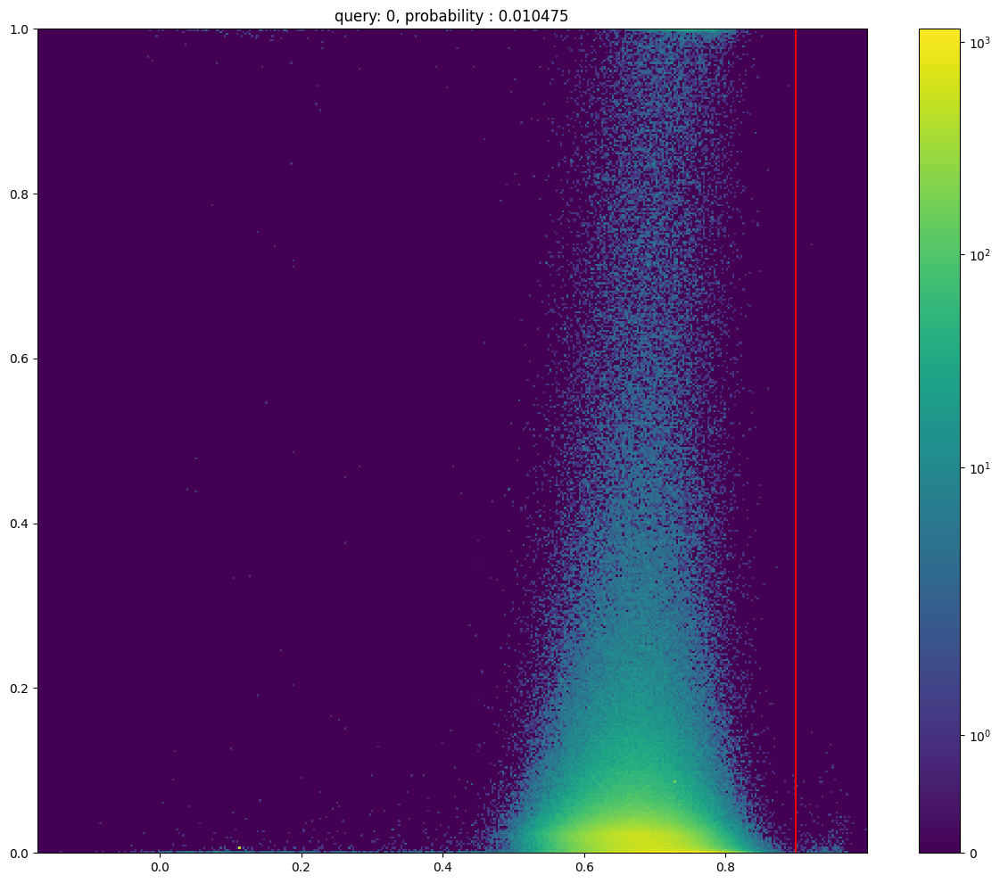

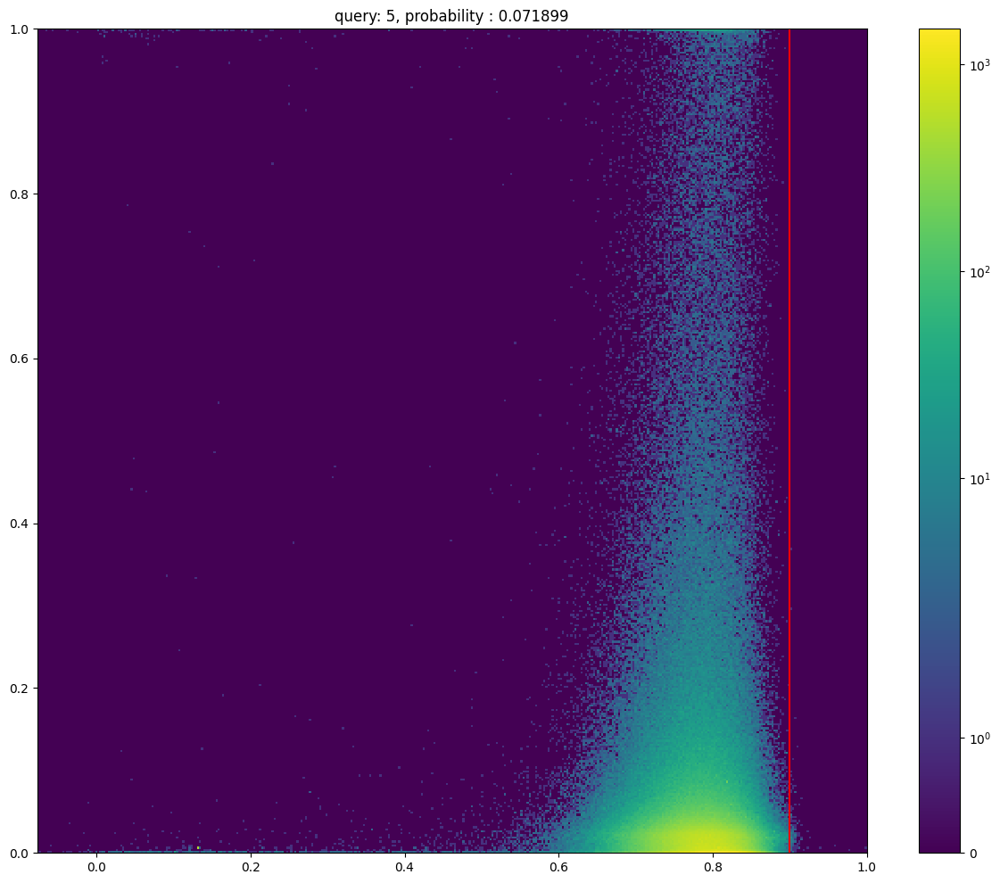

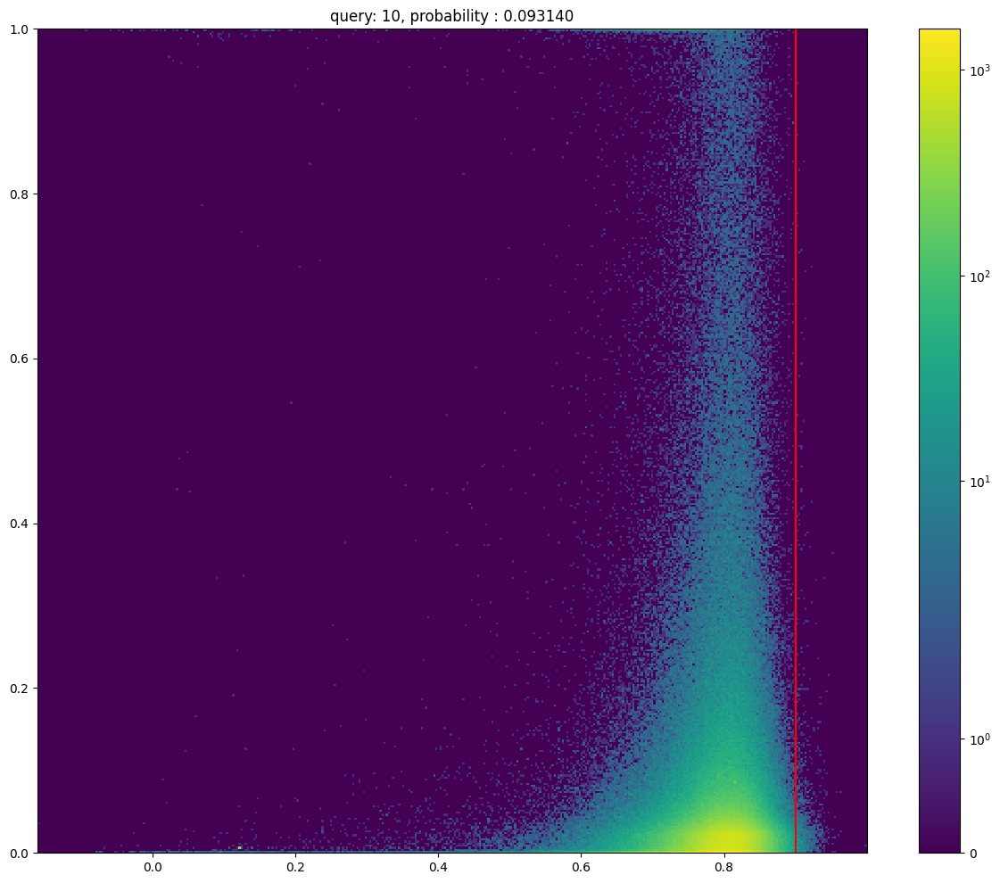

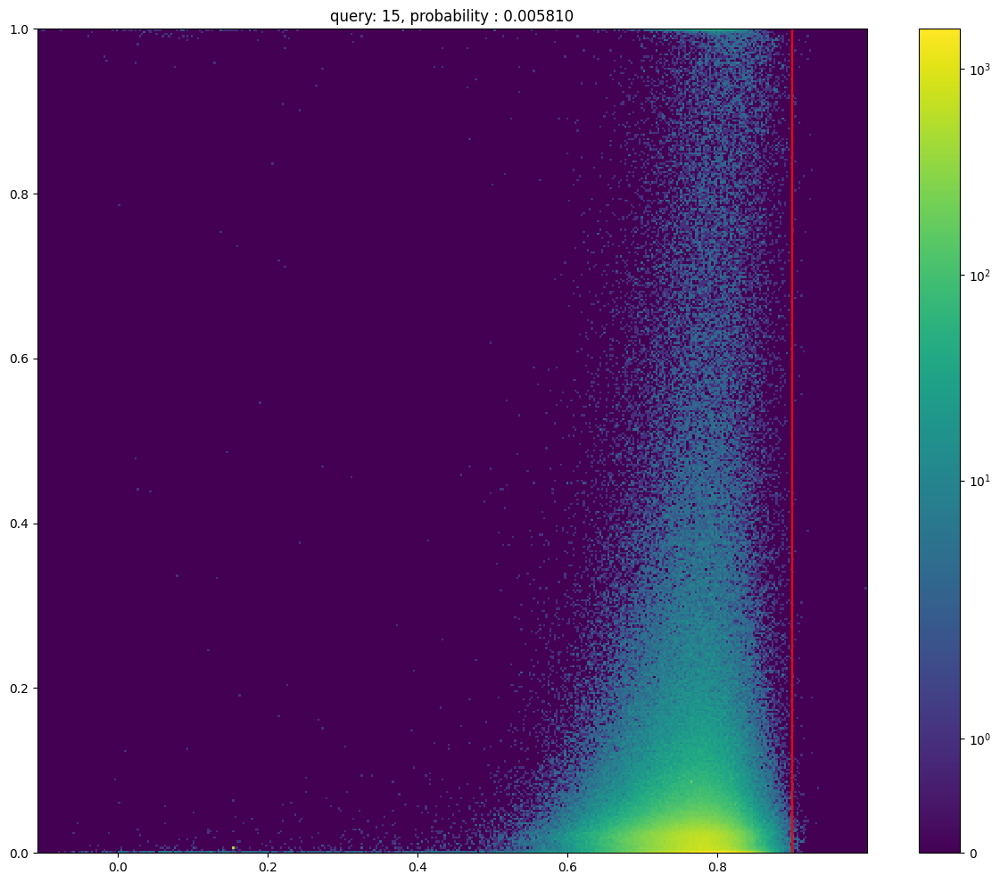

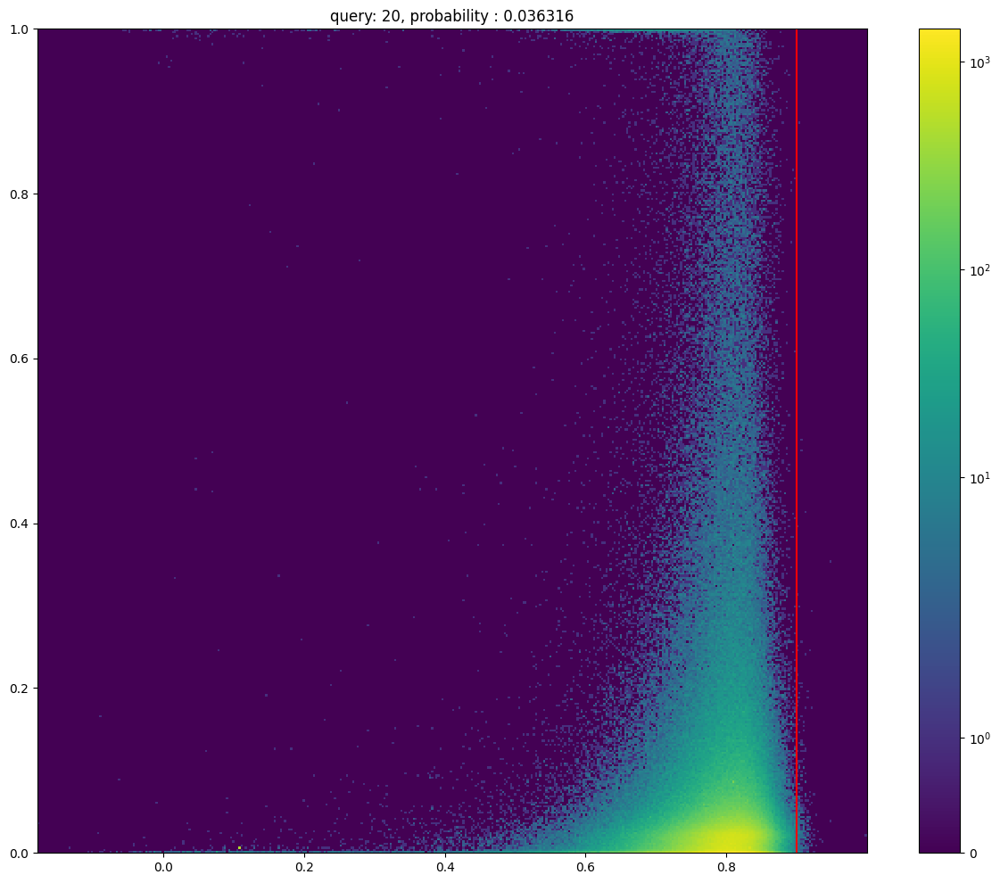

...

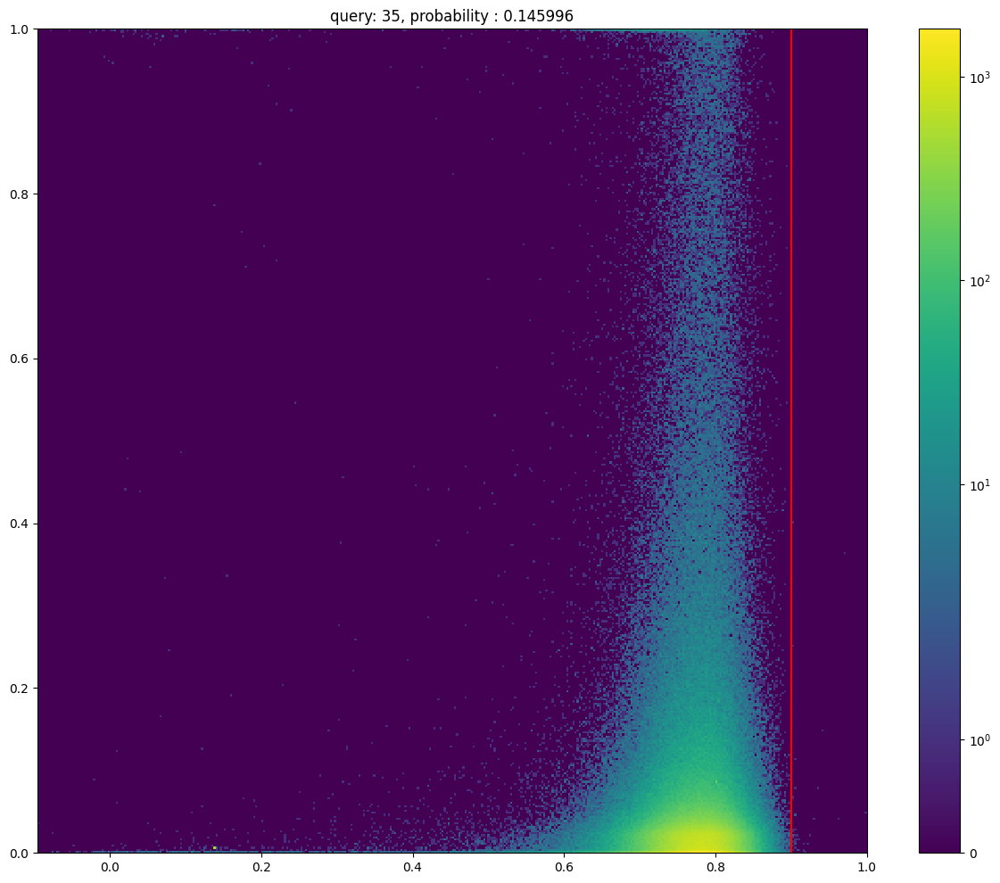

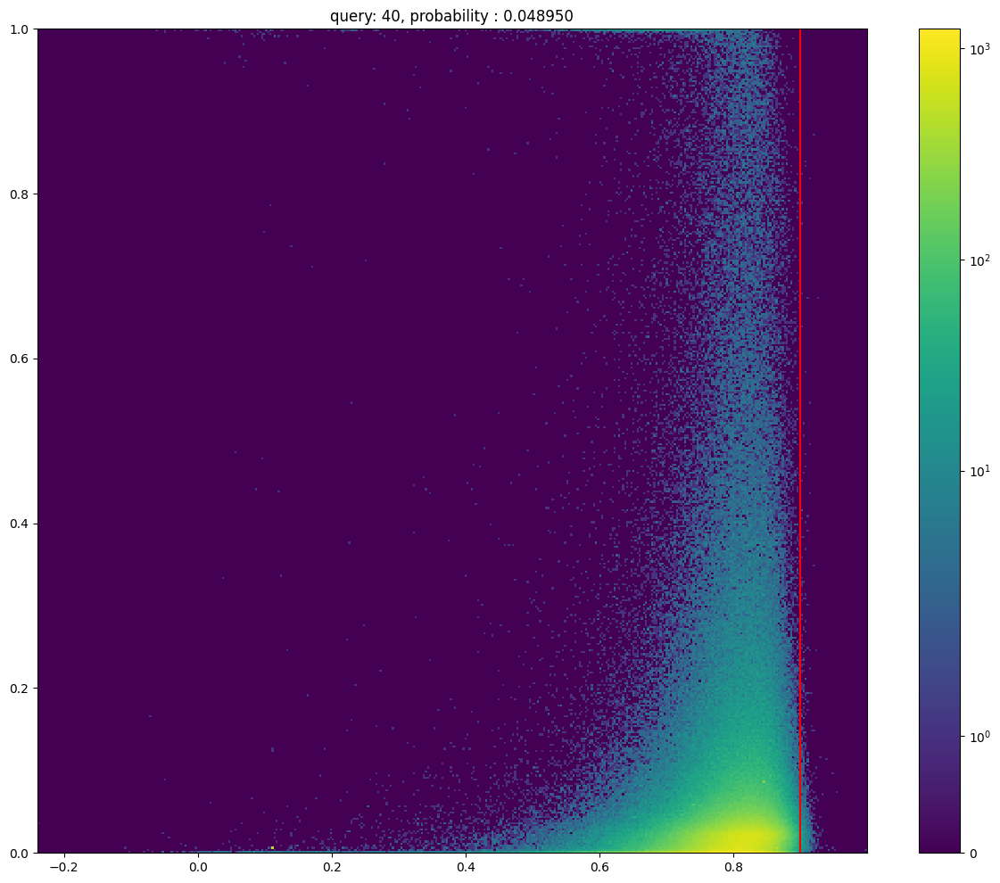

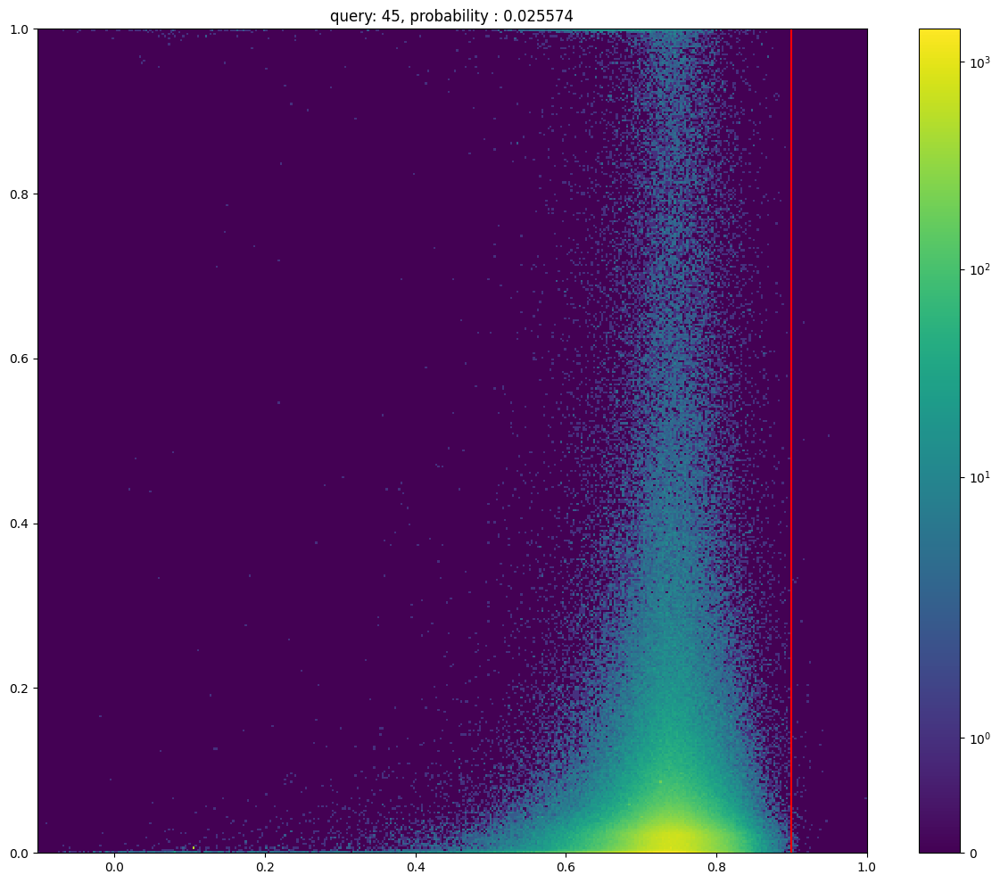

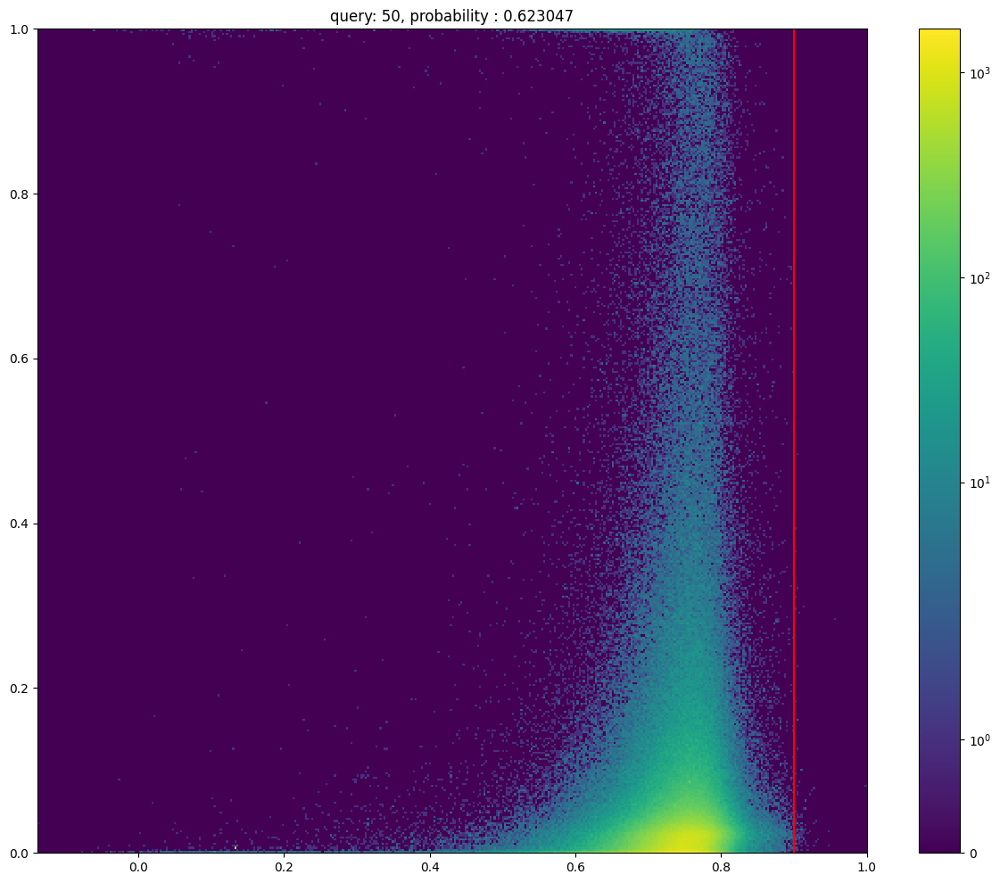

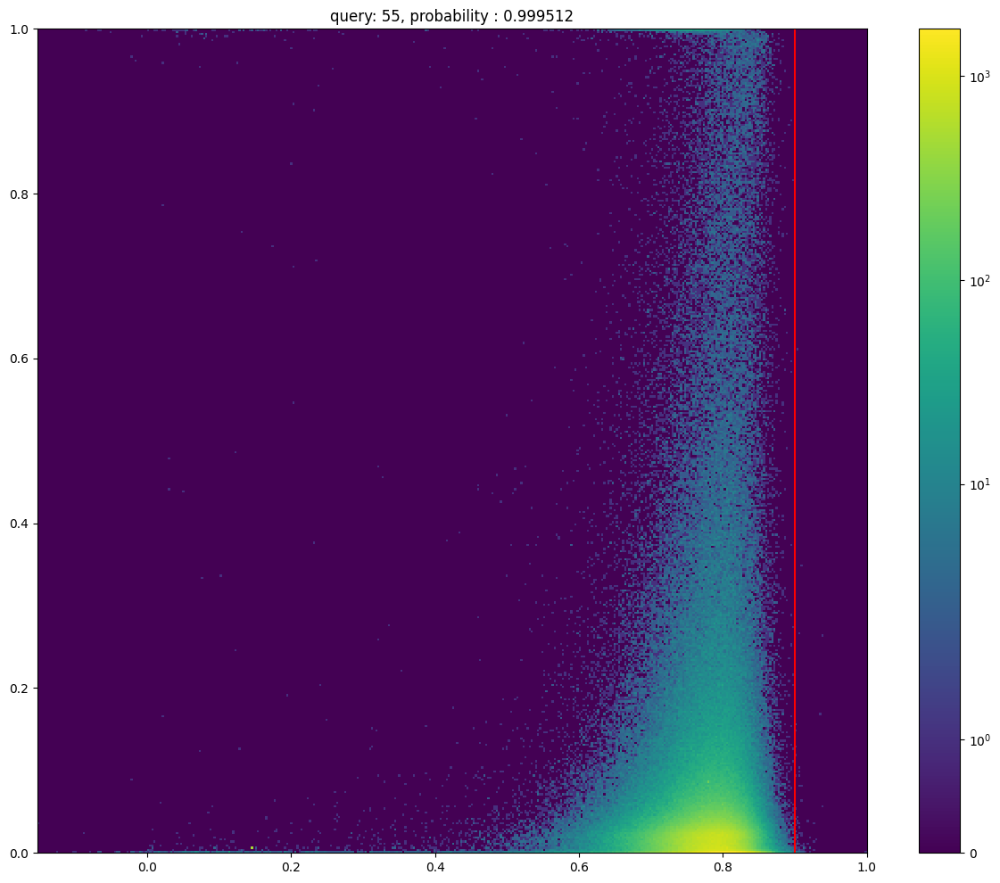

In [232]:
for i in range(0,60,5):
    plt.figure(figsize=(15,12))
    plt.hist2d(allc[:, i], probabilities, bins=400, norm='symlog');
    plt.plot([0.9, 0.9], [0, 1], color='red')
    plt.title('query: %d, probability : %f' % (i,probabilities[40077: 46684][::100][i]))
    plt.colorbar()

In [275]:
token_id

2167

In [287]:
_, __, ___ = np.repeat(1,3)

1

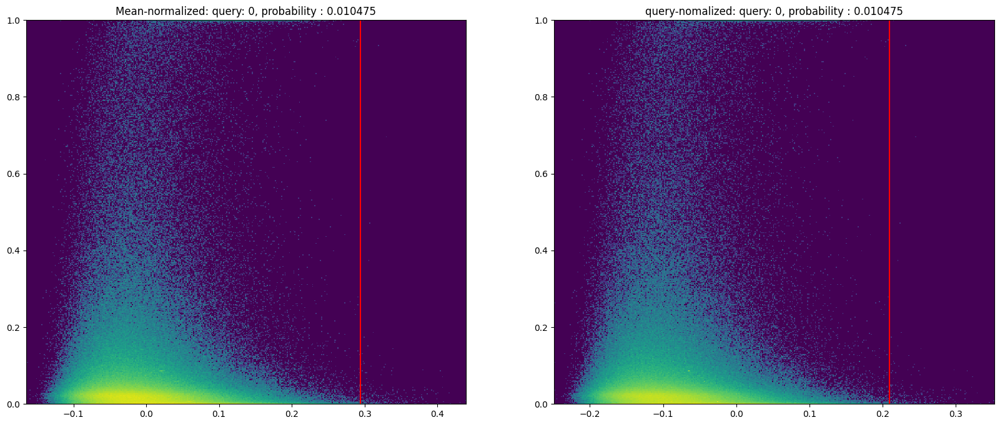

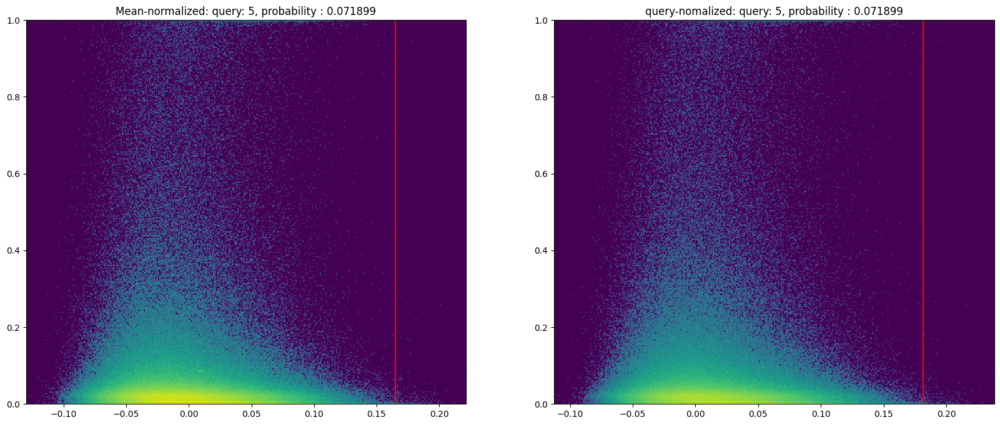

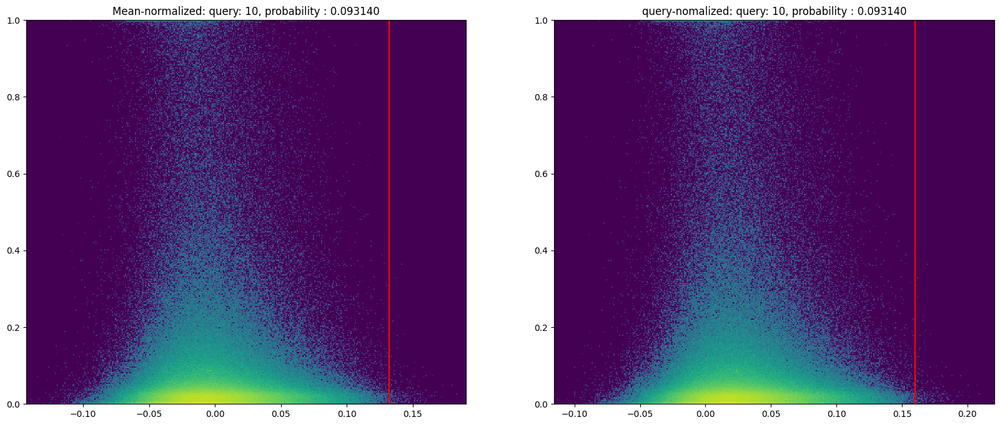

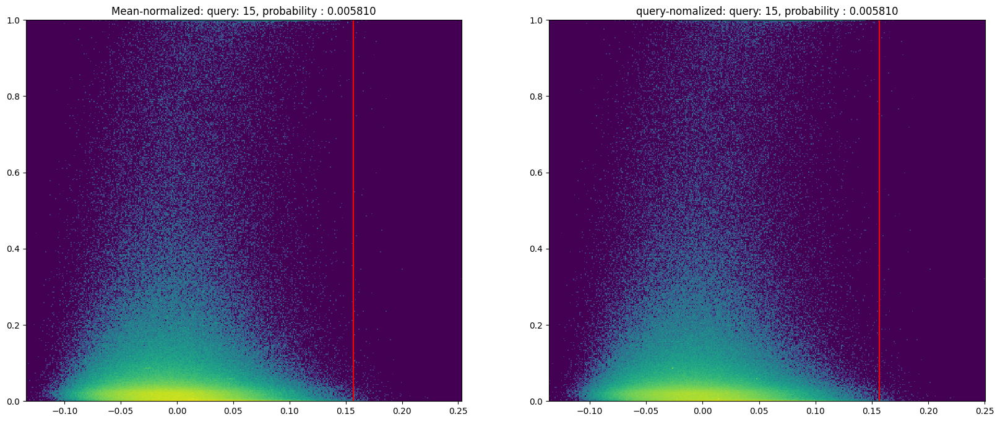

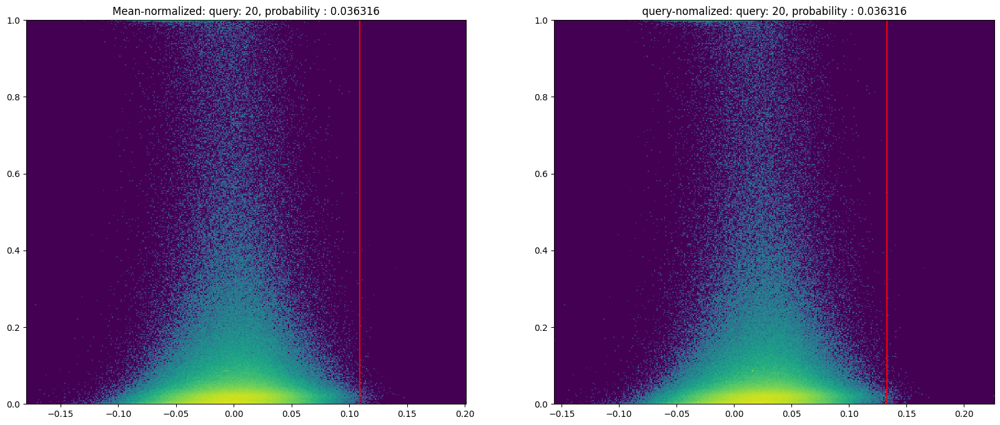

...

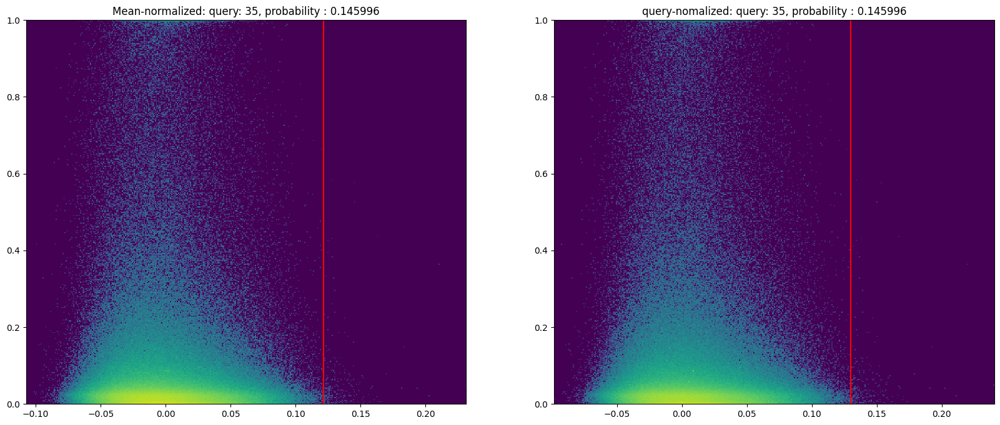

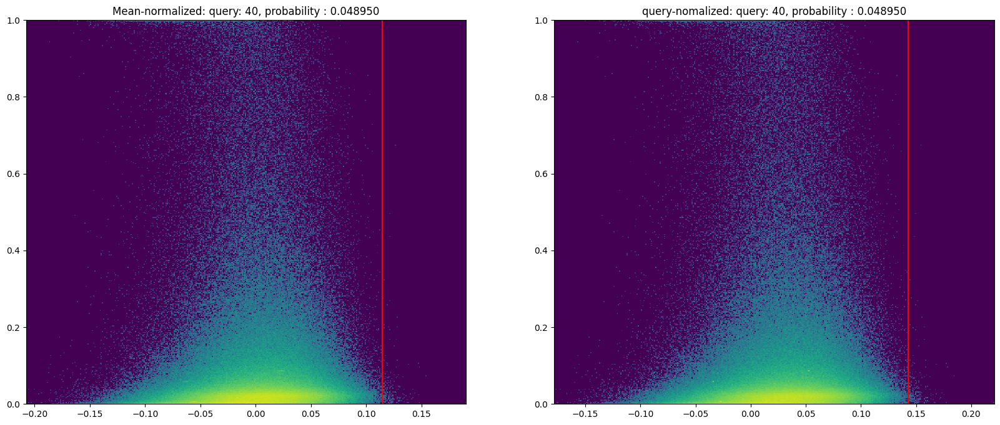

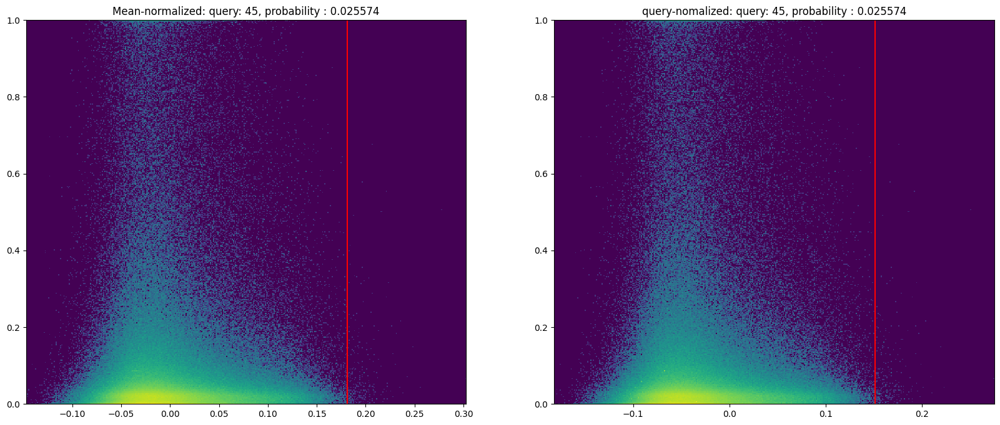

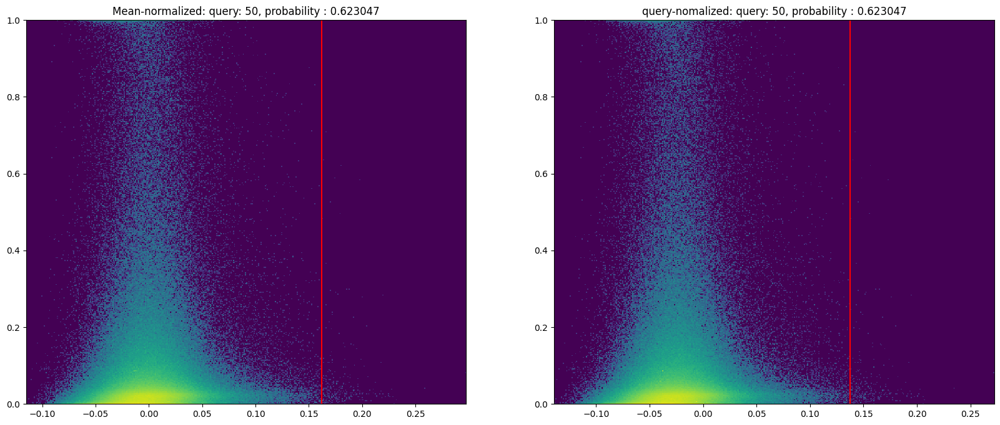

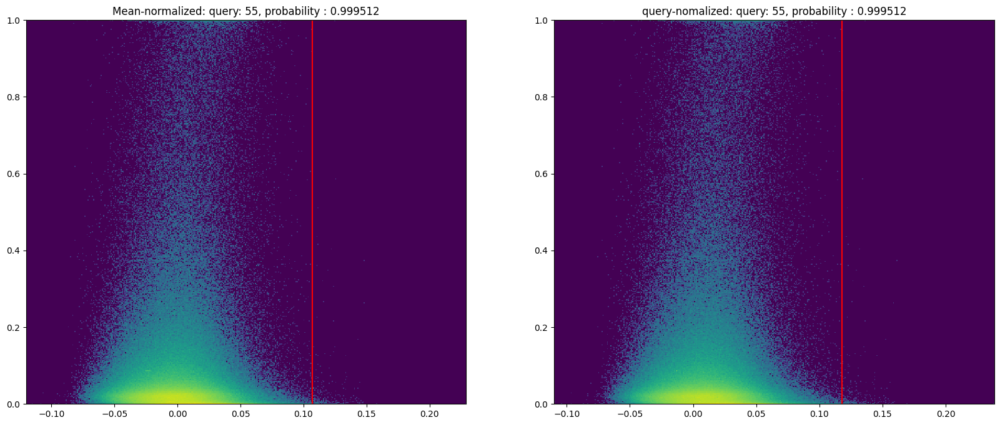

In [274]:
for i in range(0,60,5):
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    plt.hist2d(mean_normed[:, i], probabilities, bins=400, norm='symlog');
    plt.plot([np.percentile(mean_normed[:, i], 99.95)]*2, [0, 1], color='red')
    # Queries were built from the fifth file, taking every hundredth element
    plt.title('Mean-normalized: query: %d, probability : %f' % (i,probabilities[40077: 46684][::100][i]))
    plt.subplot(1,2,2)
    plt.hist2d(query_normed[:, i], probabilities, bins=400, norm='symlog');
    plt.plot([np.percentile(query_normed[:, i], 99.95)]*2, [0, 1], color='red')
    # Queries were built from the fifth file, taking every hundredth element
    plt.title('query-nomalized: query: %d, probability : %f' % (i,probabilities[40077: 46684][::100][i]))
    # plt.colorbar()

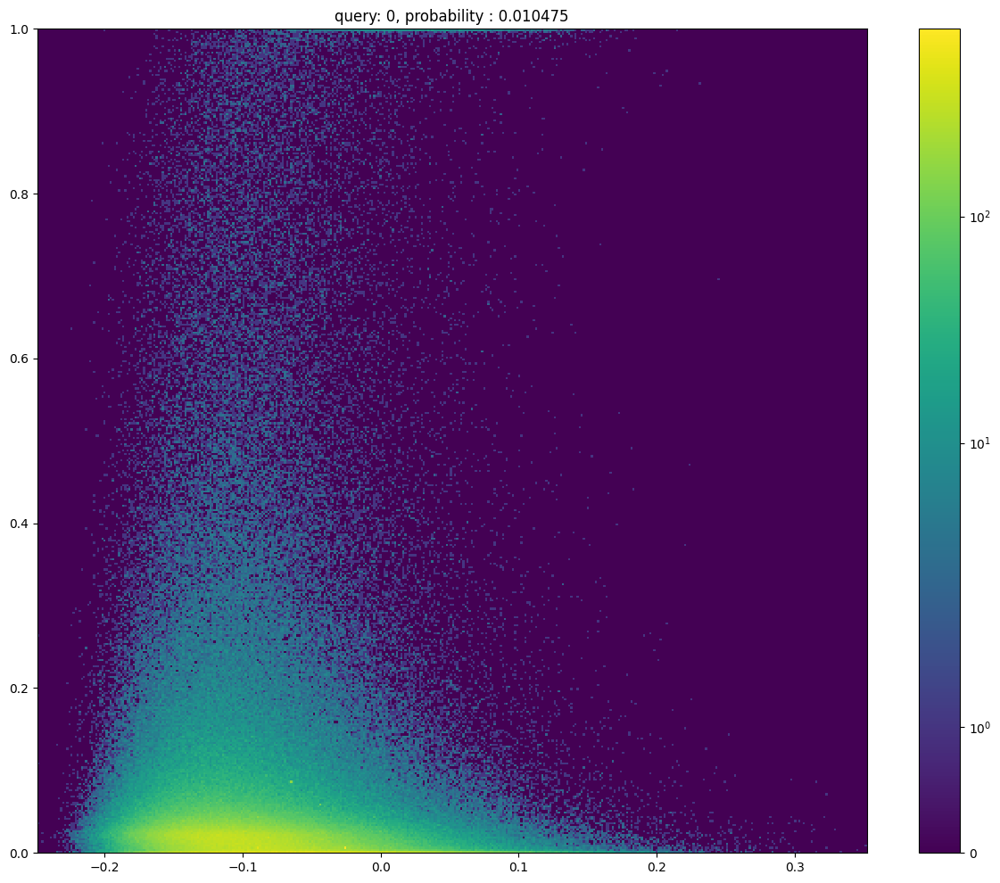

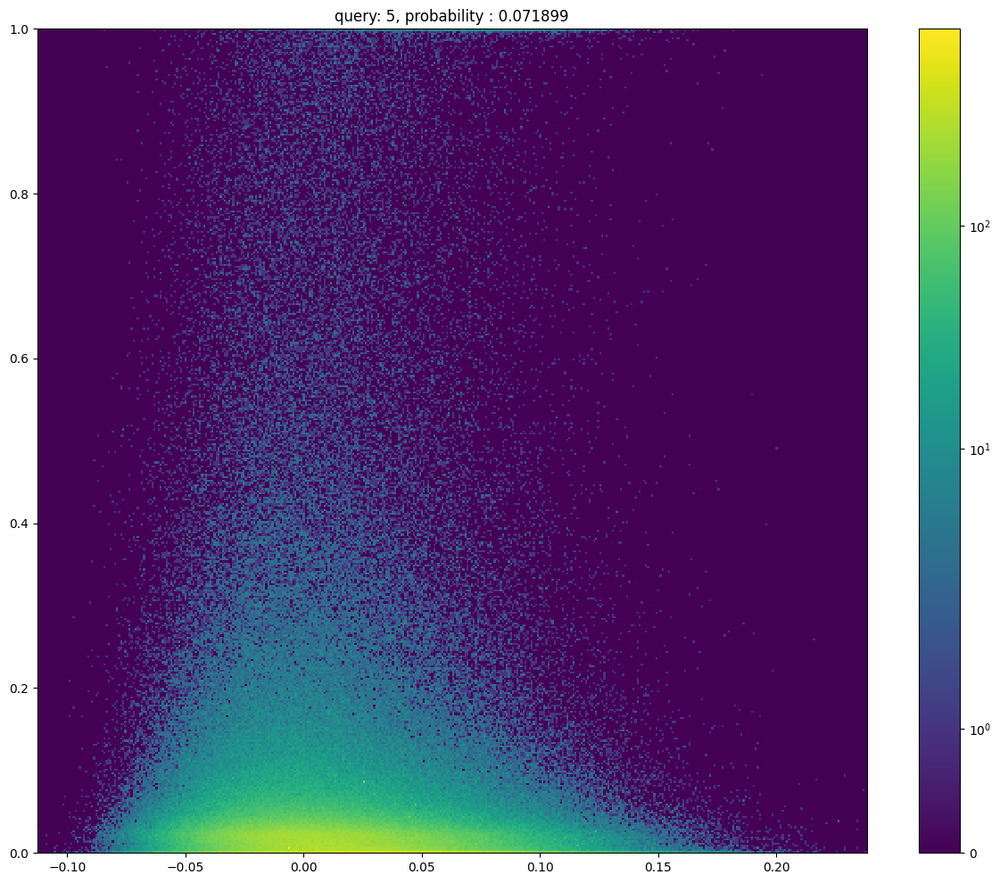

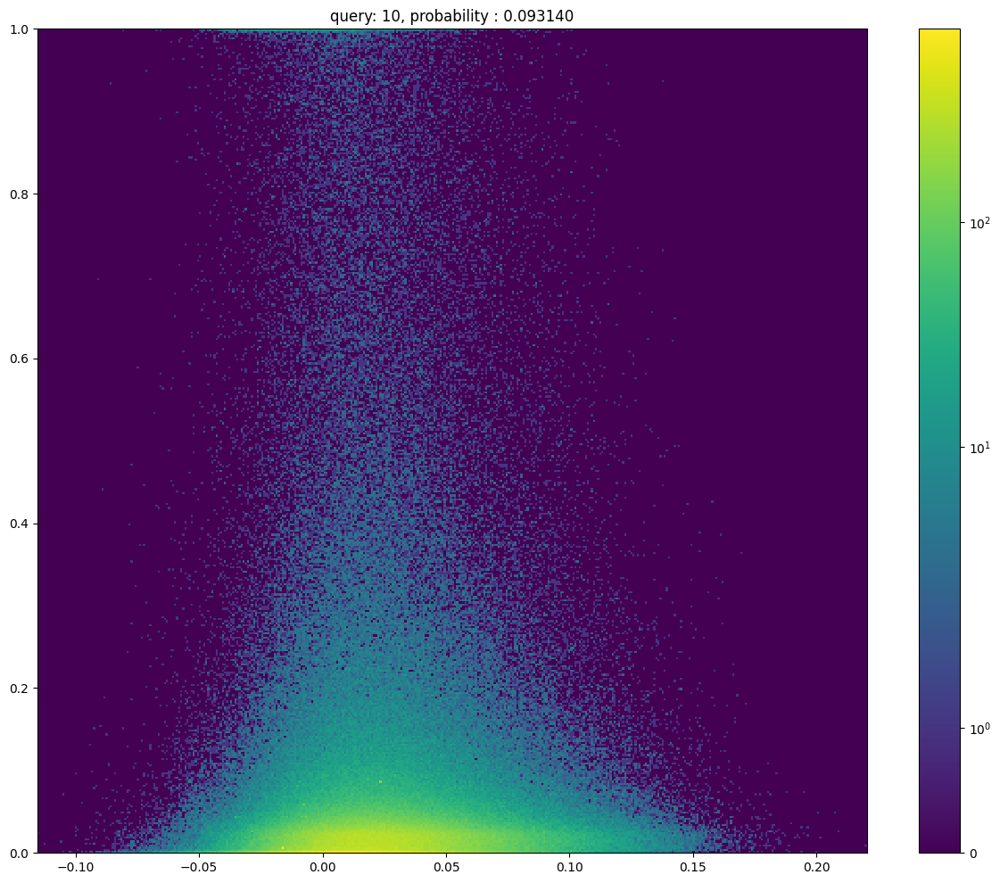

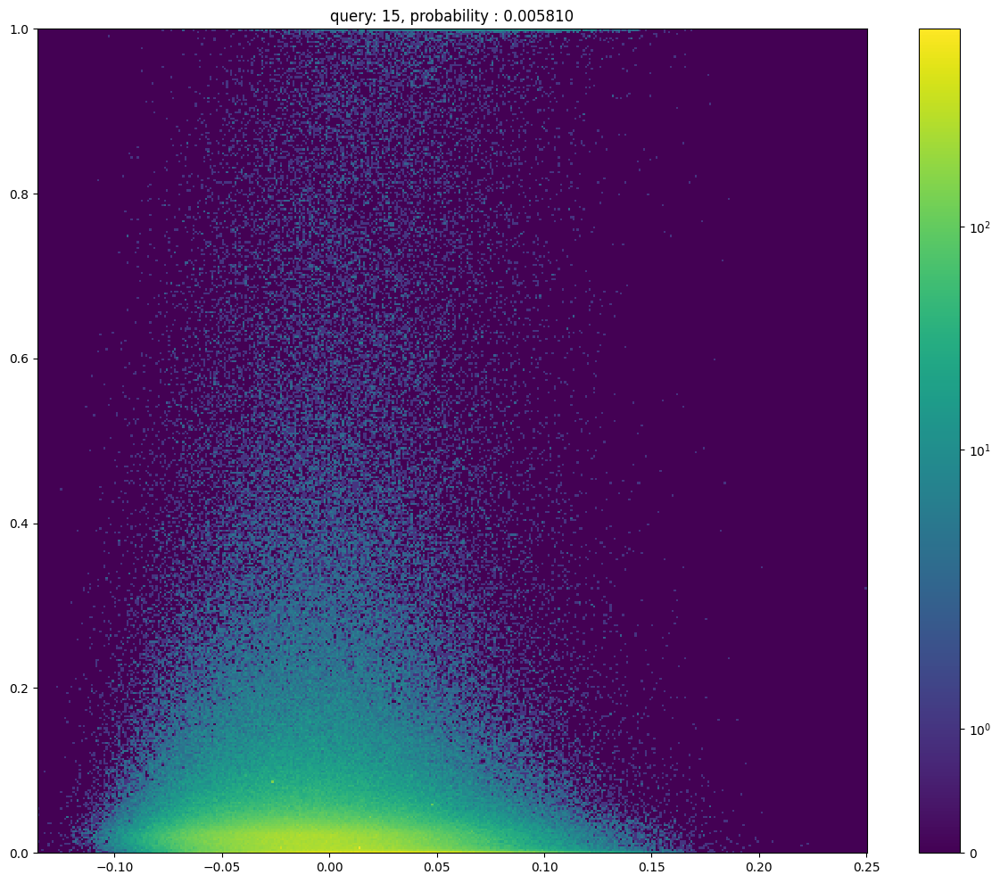

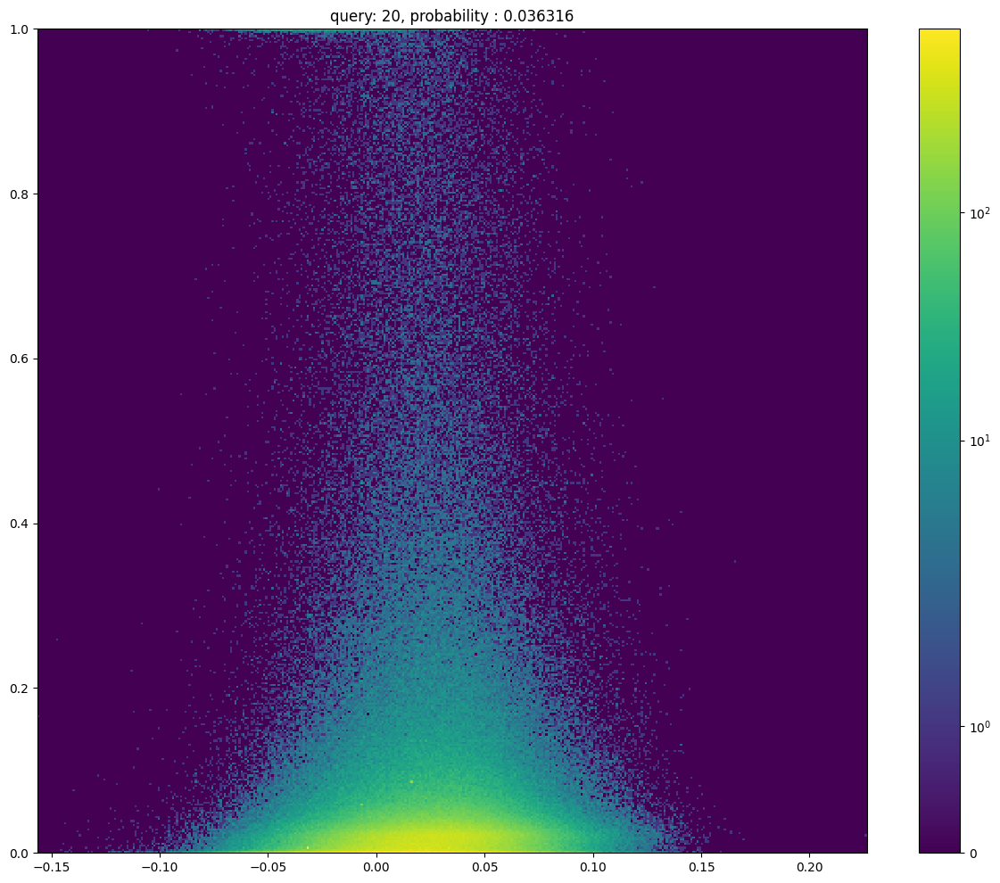

...

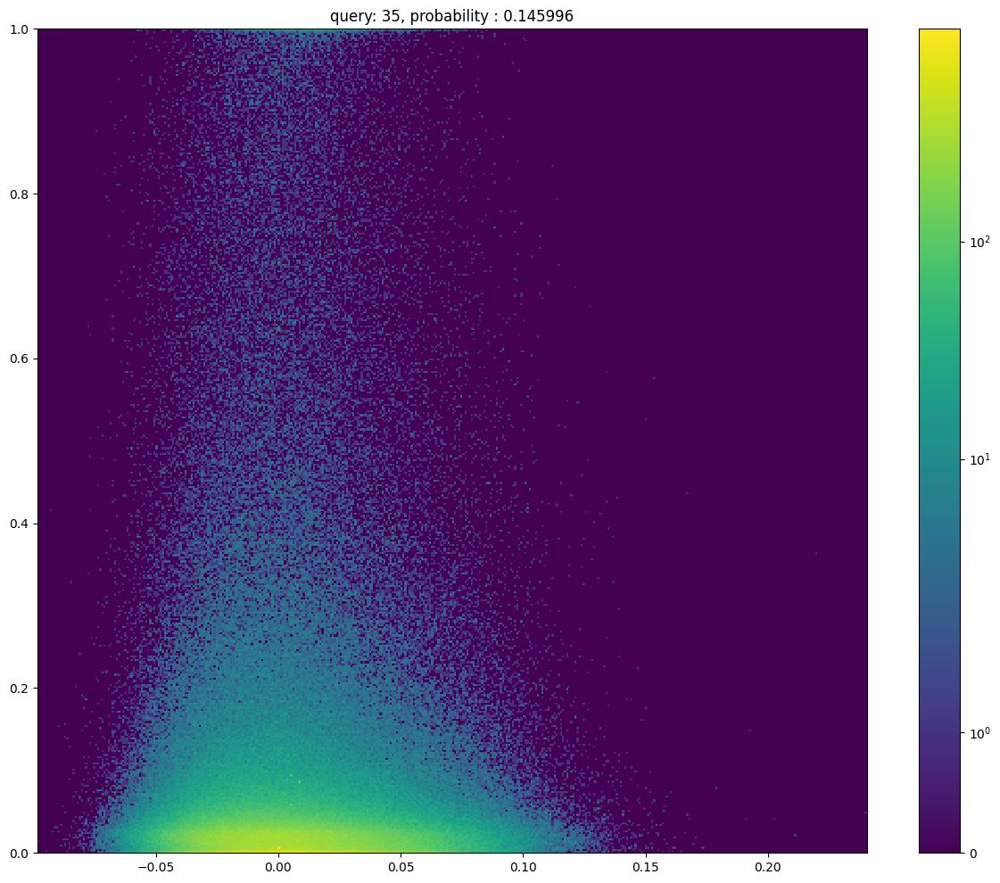

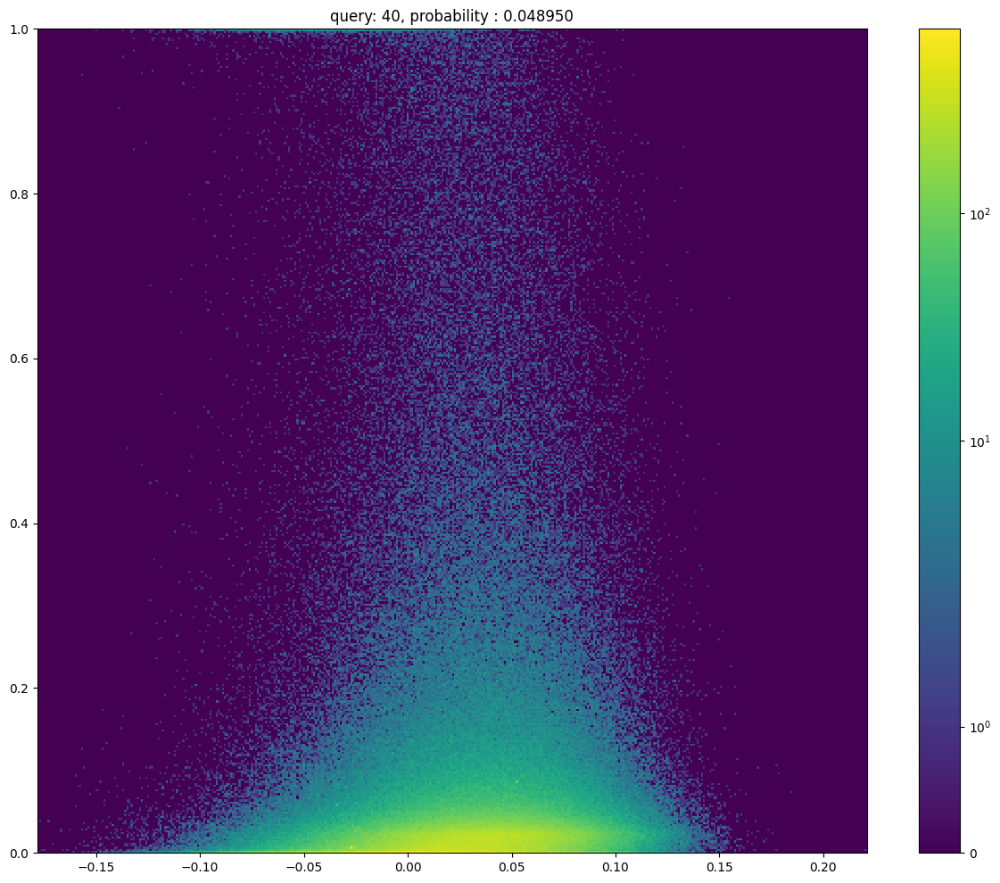

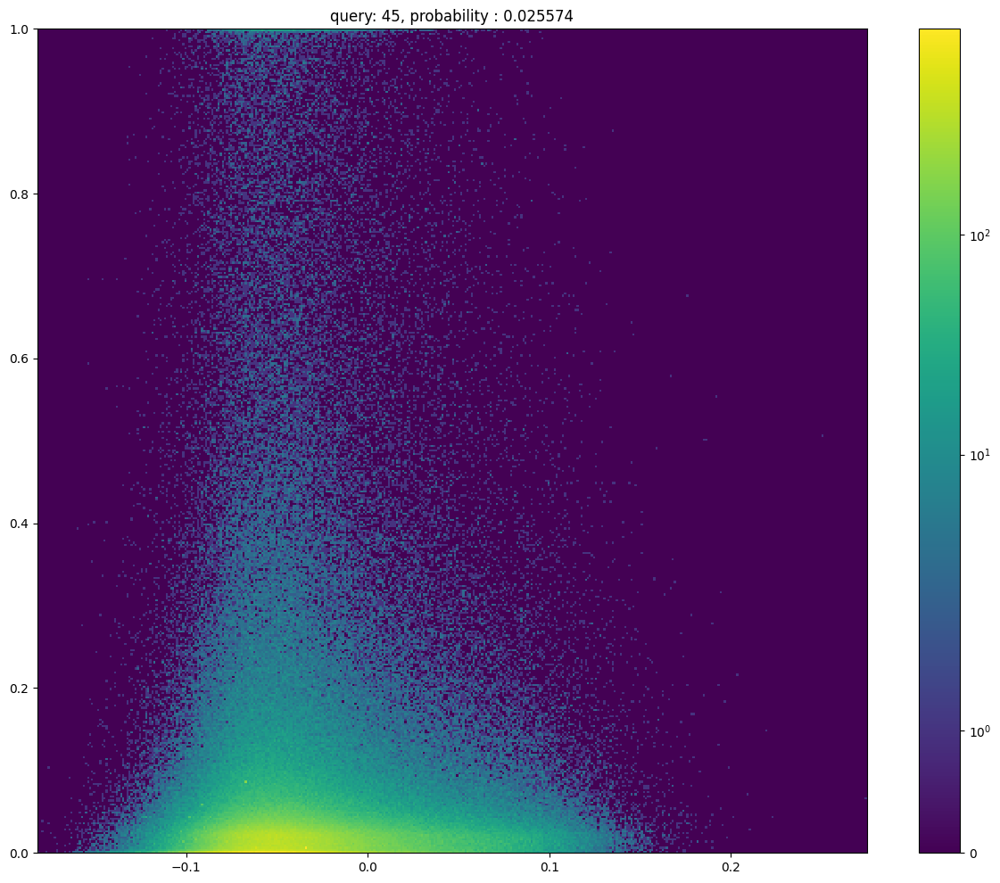

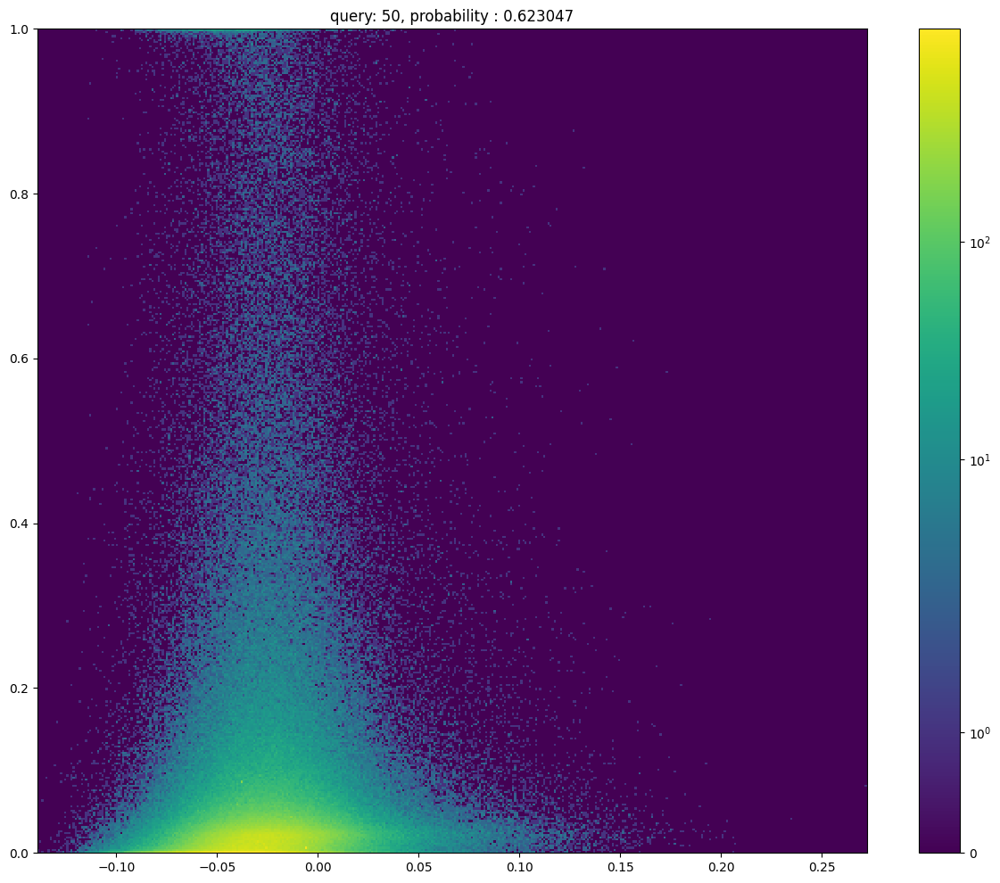

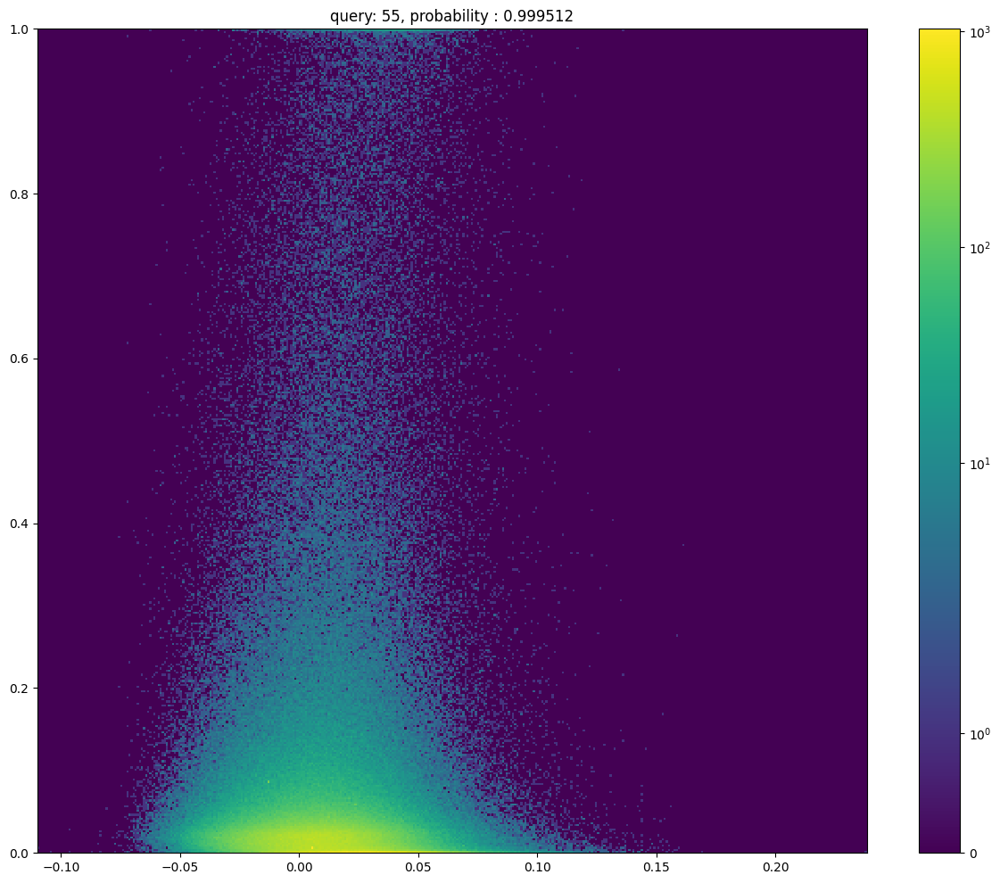

In [268]:
for i in range(0,60,5):
    plt.figure(figsize=(15,12))
    plt.hist2d(query_normed[:, i], probabilities, bins=400, norm='symlog');
    plt.plot([0.9, 0.9], [0, 1], color='red')
    # Queries were built from the fifth file, taking every hundredth element
    plt.title('query: %d, probability : %f' % (i,probabilities[40077: 46684][::100][i]))
    plt.colorbar()

In [264]:
np.percentile(allc[:, 0], 99.95)

0.8726039206981819

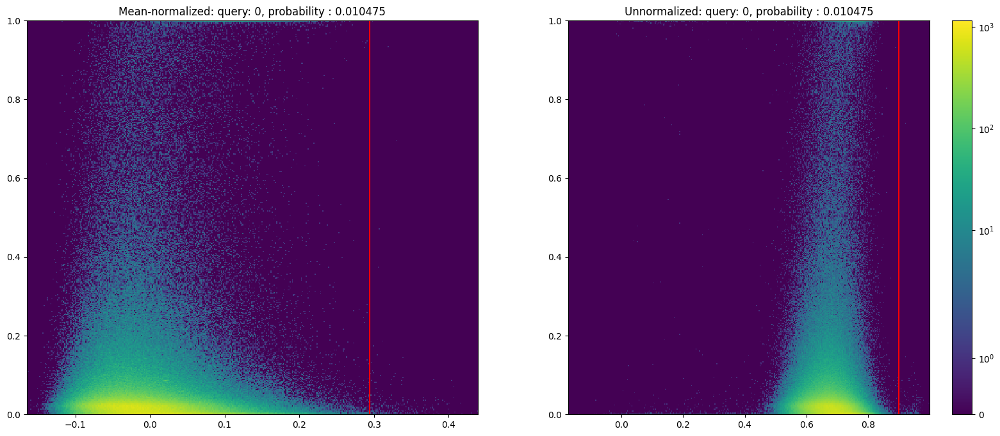

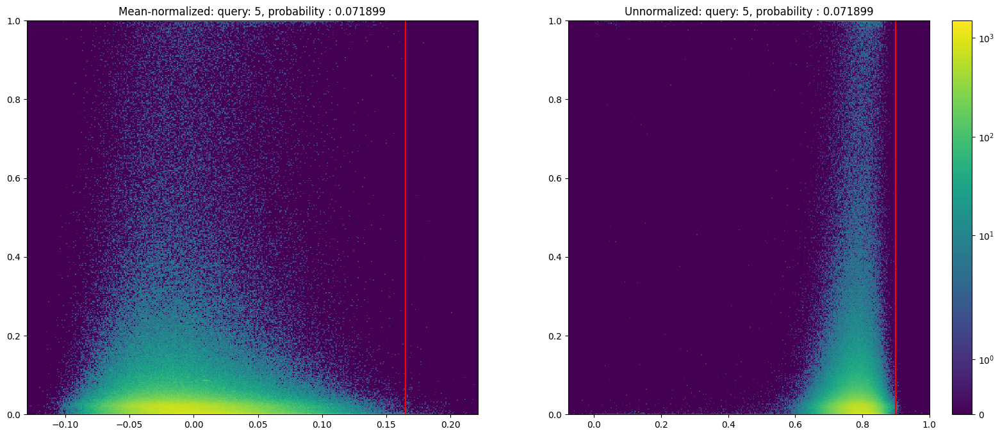

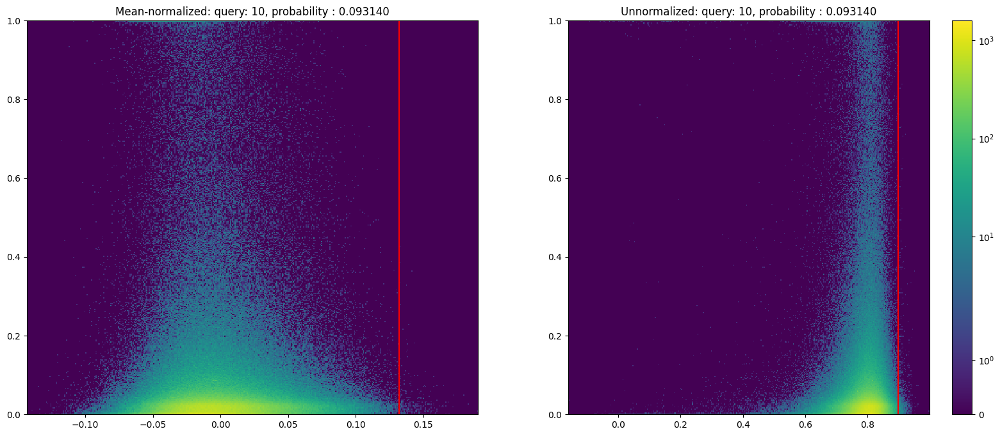

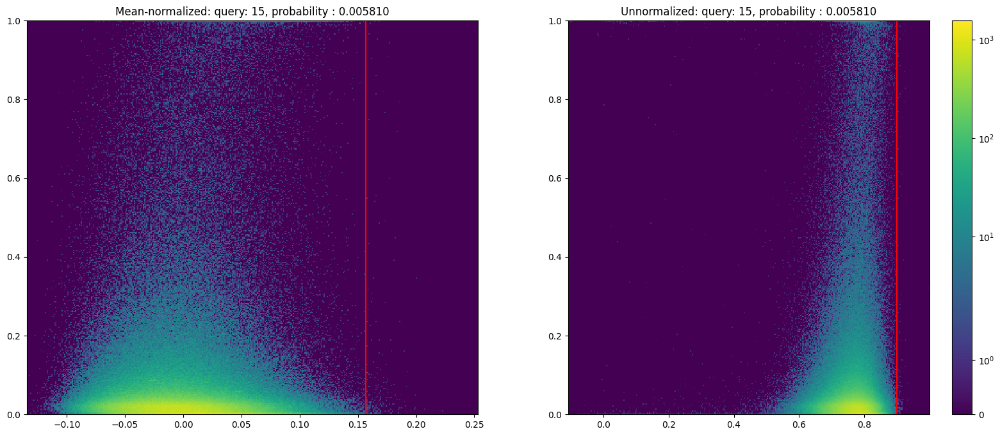

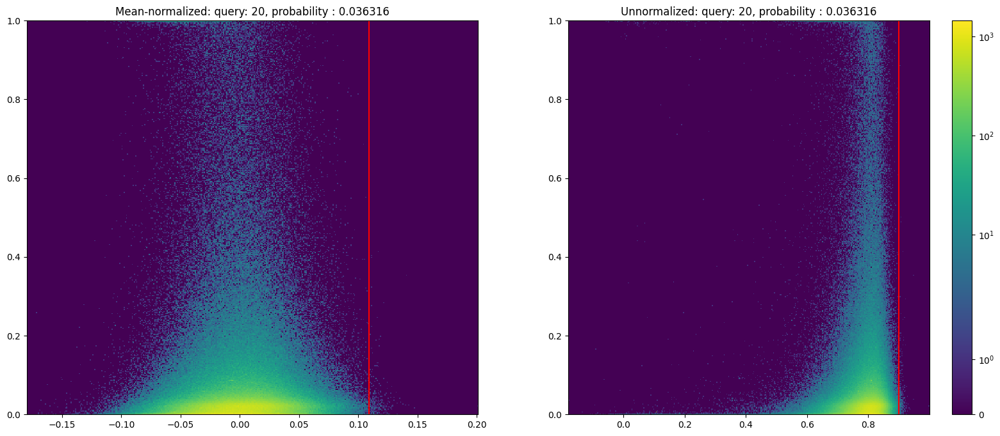

...

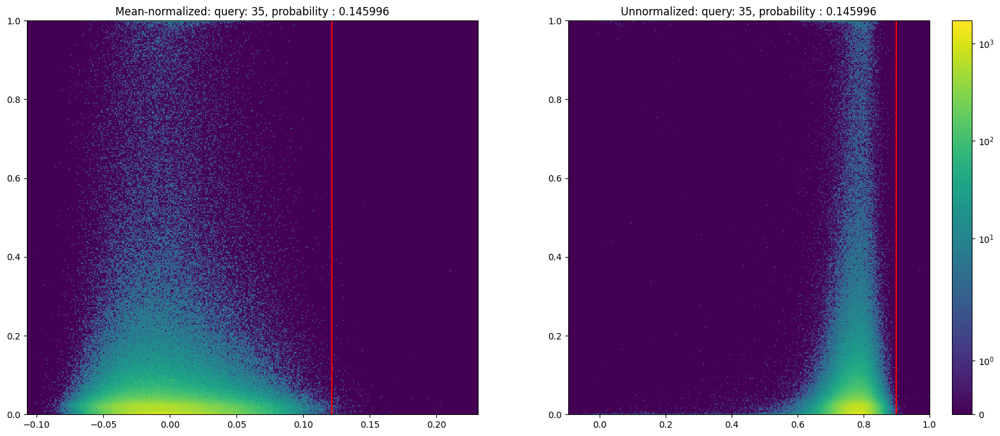

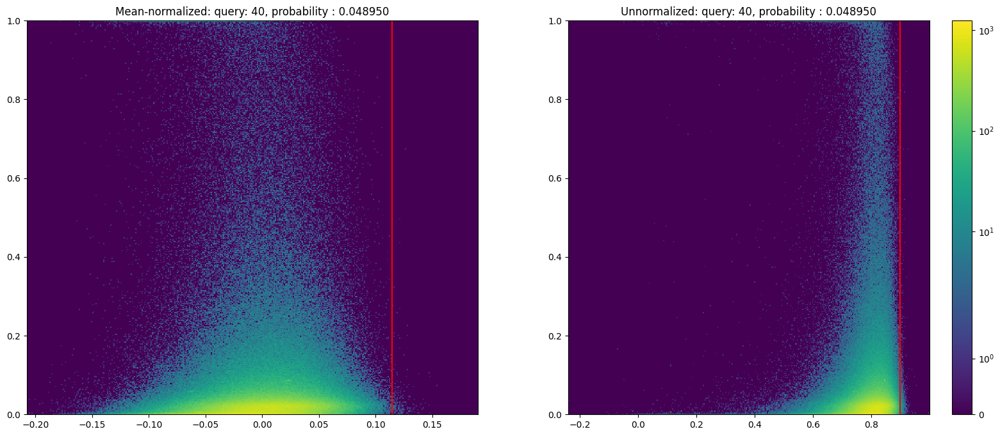

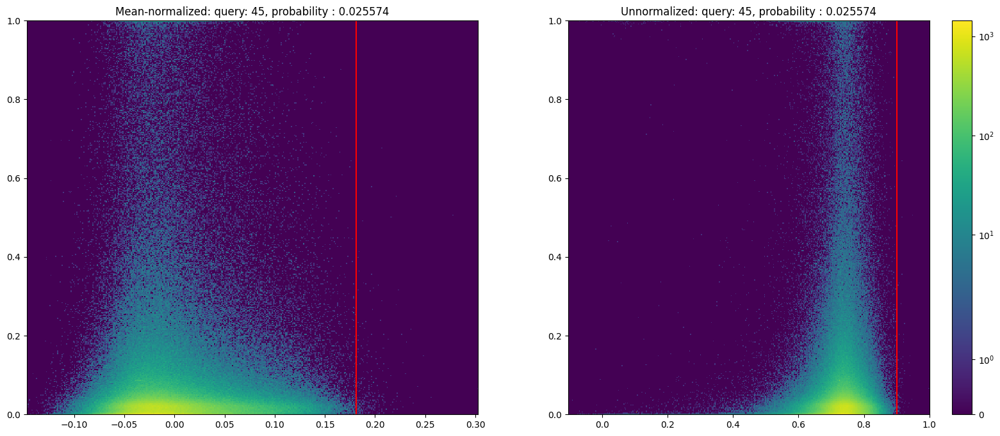

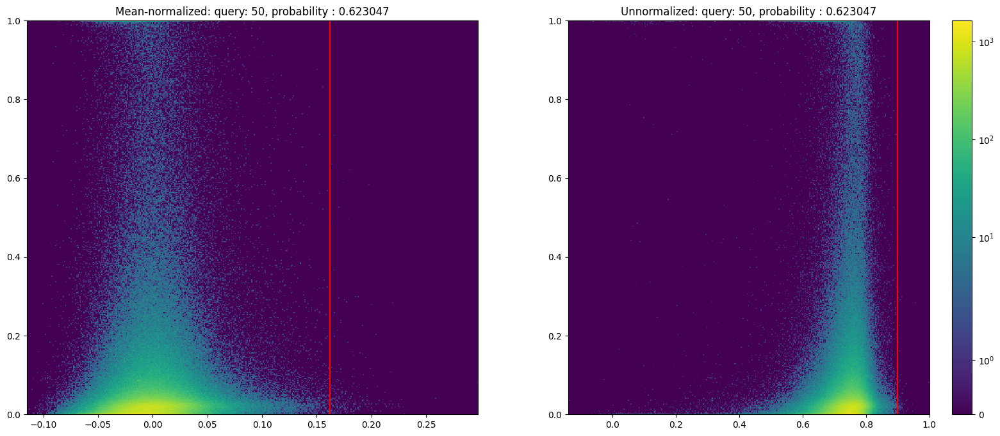

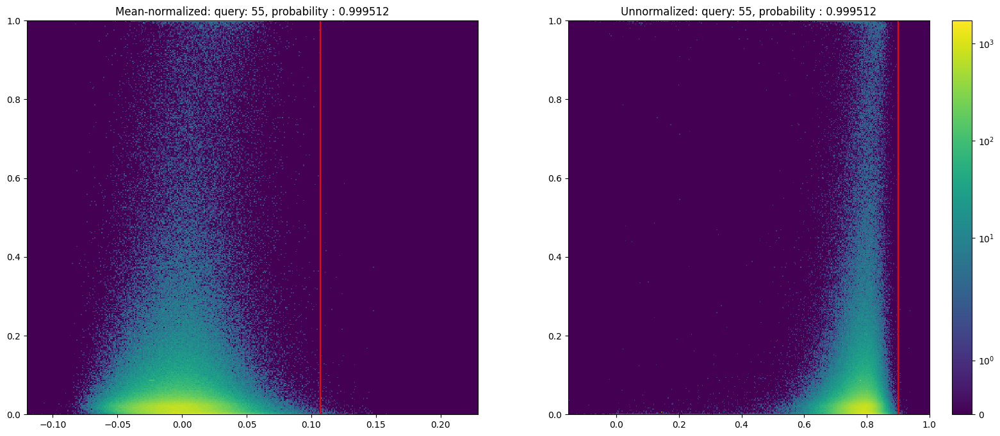

In [265]:
for i in range(0,60,5):
    plt.figure(figsize=(20,8))
    plt.subplot(1,2,1)
    plt.hist2d(mean_normed[:, i], probabilities, bins=400, norm='symlog');
    plt.plot([np.percentile(mean_normed[:, i], 99.95)]*2, [0, 1], color='red')
    # Queries were built from the fifth file, taking every hundredth element
    plt.title('Mean-normalized: query: %d, probability : %f' % (i,probabilities[40077: 46684][::100][i]))
    plt.subplot(1,2,2)
    plt.hist2d(allc[:, i], probabilities, bins=400, norm='symlog');
    plt.plot([0.9, 0.9], [0, 1], color='red')
    # Queries were built from the fifth file, taking every hundredth element
    plt.title('Unnormalized: query: %d, probability : %f' % (i,probabilities[40077: 46684][::100][i]))
    plt.colorbar()

In [267]:
(query_normed - mean_normed).std()

0.08910805

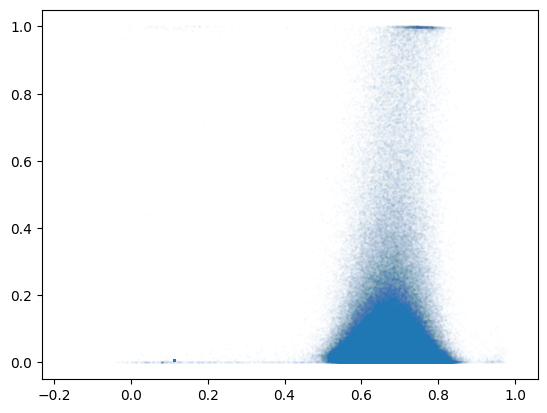

In [182]:
plt.scatter(allc[:, 0], probabilities, s=1, alpha=0.01);

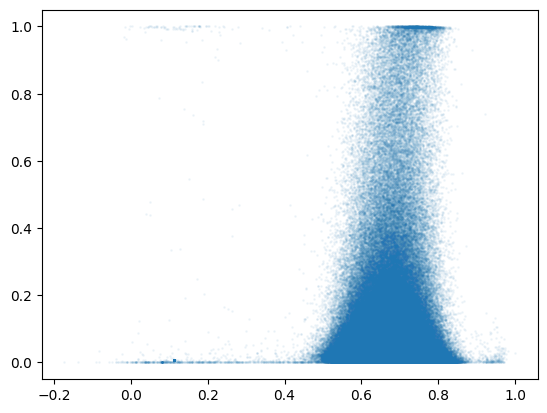

In [196]:
plt.scatter(allc[:, 0], probabilities, s=1, alpha=0.05);

In [61]:
i=0
temp=l_emb[i].astype(np.float32) / np.linalg.norm(l_emb[i].astype(np.float32),axis=-1,keepdims=True)

In [62]:
query=l_emb[5][::100,:]
query=query.astype(np.float32) / np.linalg.norm(query.astype(np.float32),axis=-1,keepdims=True)

In [60]:
query.shape

(68, 2048)

In [235]:
query.shape

(68, 2048)

In [65]:
allc=[]
for i in tqdm(range(100)):
    temp=l_emb[i].astype(np.float32) / np.linalg.norm(l_emb[i].astype(np.float32),axis=-1,keepdims=True)
    allc.append( temp@query.T )

100%|█████████████████████████████████████████| 100/100 [03:43<00:00,  2.23s/it]


In [71]:
allc=np.concatenate(allc)

In [255]:
mean_normed = []
for i in tqdm(range(100)):
    temp=l_emb[i].astype(np.float32) / np.linalg.norm(l_emb[i].astype(np.float32),axis=-1,keepdims=True)
    mean_normed.append( (temp - temp.mean(axis=0, keepdims=True)) @ (query - query.mean(axis=0, keepdims=True)).T )
mean_normed = np.concatenate(mean_normed)

100%|█████████████████████████████████████████| 100/100 [00:48<00:00,  2.06it/s]


In [256]:
query_normed = []
for i in tqdm(range(100)):
    temp=l_emb[i].astype(np.float32) / np.linalg.norm(l_emb[i].astype(np.float32),axis=-1,keepdims=True)
    query_normed.append( (temp) @ (query - query.mean(axis=0, keepdims=True)).T )
query_normed = np.concatenate(query_normed)

100%|█████████████████████████████████████████| 100/100 [00:50<00:00,  1.98it/s]


In [239]:
mean_normed.shape

(661621, 68)

In [90]:
compact_scores = allc.mean(axis = 0), allc.std(axis=0)

In [91]:
compact_scores = np.concatenate((compact_scores[0][..., None], compact_scores[1][..., None]), axis=1)

In [101]:
np.concatenate(l_t_prob[0:100],axis=0).shape

(661621, 100)

In [103]:
index

array([[  1,  26],
       [  2, 132],
       [  2, 506],
       ...,
       [998, 638],
       [998, 680],
       [998, 704]], dtype=int16)

In [102]:
allc.shape

(661621, 68)

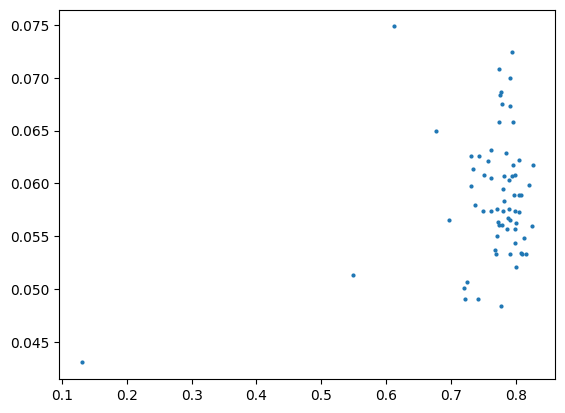

In [97]:
plt.scatter(compact_scores[:, 0], compact_scores[:,1], s=4)

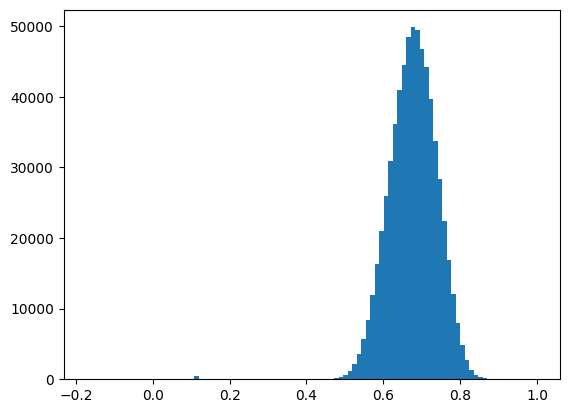

In [73]:
plt.hist(allc[:,0],bins=100);

In [3]:
# Collecting data
l=[]
for file_no in tqdm(range(start_file, min(1000, start_file + nfiles))):
    with open(os.path.join(LOCATION,f"{file_no:04d}_id_gt.pkl"),   "rb") as f: l.append((np.fromfile(f, dtype=np.int32)).reshape(1000, 1024))
ID=torch.concatenate(l,dim=0).to(device)
l=[]
for file_no in tqdm(range(1,29)):
    with open(os.path.join(LOCATION,f"{file_no:04d}_id_t.pkl"),   "rb") as f: l.appendtorch.tensor(np.fromfile(f, dtype=np.int32), device='cpu').reshape(1000, 1024, 100)
        )
T_ID = torch.concatenate(l, dim=0).to(device)
l=[]
for file_no in tqdm(range(1,29)):
    with open(os.path.join(LOCATION,f"{file_no:04d}__{token_id}_student_logits.pkl"),   "rb") as f: l.append(pickle.load(f).cpu())
SL = torch.concatenate(l, dim=0).to(device)
l=[]
for file_no in tqdm(range(1,29)):
    with open(os.path.join(LOCATION,f"{file_no:04d}_logit_t.pkl"),   "rb") as f: l.append(pickle.load(f).cpu())
TL = torch.concatenate(l, dim=0).to(device)

100%|███████████████████████████████████████████| 28/28 [00:05<00:00,  5.27it/s]


In [4]:
SNL = (torch.softmax(SL, dim=-1) + 0.0001).log()
TNL = (torch.softmax(TL, dim=-1) + 0.0001).log()

In [5]:
residuals = SNL - TNL

In [6]:
class EmbeddingsDataset(torch.utils.data.Dataset):
    def __init__(self, token_id, device, emb_size = 2048):
        self.token_id = token_id
        self.device = device
        self.informations = get_embeddings(self.token_id, embedding_size=emb_size)
        
        self.informations['embeddings']= torch.tensor(self.informations['embeddings'])
        for k, v in self.informations.items():
            self.informations[k] = v.to(self.device)
    def __len__(self):
        return self.informations['embeddings'].shape[0]
    def __getitem__(self, i):
        emb = torch.tensor(self.informations['embeddings'][i])
        example_id = self.informations['example_id'][i]
        token_pos = self.informations['positions'][i]
        return {"embedding" : emb, "example_id" : example_id, "token_pos" : token_pos}

def read_embedding(file_num, offset, embedding_size):
    arr = np.fromfile(os.path.join(LOCATION,f"{file_num:04d}_emb_s"), dtype='float16', count=embedding_size, offset=offset)
    return arr

def get_embeddings(token_id, embedding_size=2048):
    token_of_interest = token_id
    example_id, token_position = map(torch.squeeze, ((ID[:, 0][..., None] != 0) * (T_ID == token_of_interest).any(dim=-1)).nonzero().split(1, dim=1))
    ranks = (T_ID[example_id, token_position] == token_of_interest).nonzero()[:, 1]
    filenumber = example_id // 1000 + 1
    offsets = token_position * embedding_size
    embeddings = [read_embedding(file_no, offset, embedding_size) for (file_no, offset) in zip(filenumber, offsets)]
    embeddings = np.stack(embeddings)
    matrix_info = {
        'embeddings': embeddings,
        'example_id': example_id,
        'positions' : token_position,
        'ranks'     : ranks,
    }
    return matrix_info

def get_targets(model, embeddings):
    logits = model(embeddings)
    probs = torch.softmax(logits, dim=-1)
    normed_logits = probs.log() + 0.0001
    return normed_logits, probs

def collate(data):
    embs = torch.concatenate([x['embedding'].unsqueeze(0) for x in data])
    ids = torch.concatenate([x['example_id'].reshape(-1) for x in  data])
    pos = torch.concatenate([x['token_pos'].reshape(-1) for x in data])
    return {"embedding" : embs, "example_id" : ids, "token_pos" : pos}


# Training the embedding layer

In [7]:
class linearlayer(torch.nn.Module):
    def __init__(self, token_id, device, embedding_size = 2048):
        super(linearlayer, self).__init__()
        self.embedding_size = embedding_size
        self.token_of_interest = token_id
        self.linear1 =torch.nn.Linear(self.embedding_size, 1, device=device,dtype=torch.float32,bias=False)
        
        with torch.no_grad():
            self.linear1.weight.data=(self.linear1.weight*0)
    
        self.device=device
    
    def forward(self, input_embs, res_prob, teacher_prob):
        input_embs = input_embs.to(torch.float32)
        res_prob = res_prob.to(torch.float32)
        teacher_prob = teacher_prob.to(torch.float32)
        y = self.linear1(input_embs)
        loss = torch.abs(res_prob - y)
        loss = loss * teacher_prob
        return y, loss

class linearlayer_withbias(torch.nn.Module):
    def __init__(self, token_id, device, embedding_size = 2048):
        super(linearlayer_withbias, self).__init__()
        self.embedding_size = embedding_size
        self.token_of_interest = token_id
        self.linear1 =torch.nn.Linear(self.embedding_size, 1, device=device,dtype=torch.float32,bias=True)
        
        with torch.no_grad():
            self.linear1.weight.data=(self.linear1.weight*0)
    
        self.device=device
    
    def forward(self, input_embs, res_prob, teacher_prob):
        input_embs = input_embs.to(torch.float32)
        res_prob = res_prob.to(torch.float32)
        teacher_prob = teacher_prob.to(torch.float32)
        y = self.linear1(input_embs)
        loss = torch.abs(res_prob - y)
        loss = loss * teacher_prob
        return y, loss

In [8]:
class multi_embedding(torch.nn.Module):
    def __init__(self, token_id, device, embedding_size = 2048, number_of_clusters = 2):
        super(multi_embedding, self).__init__()
        self.number_of_clusters=number_of_clusters
        self.embedding_size = embedding_size
        self.normalization_factor = torch.sqrt(torch.tensor(self.embedding_size).to(device))
        self.token_of_interest = token_id
        self.linear1 =torch.nn.Linear(self.embedding_size, self.number_of_clusters, device=device,dtype=torch.float32,bias=False)
        # self.linear2 =torch.nn.Linear(self.number_of_clusters, 1, device=device,dtype=torch.float32,bias=False)
        # with torch.no_grad():
        #     self.linear1.weight.data=(self.linear1.weight*0.01)

        self.device=device
        self.relu=torch.nn.ReLU()
    
    def forward(self, input_embs, res_prob, teacher_prob):
        input_embs = input_embs.to(torch.float32)
        res_prob = res_prob.to(torch.float32)
        teacher_prob = teacher_prob.to(torch.float32)
        # print('input_embs',input_embs.shape)
        scores = self.linear1(input_embs)
        scores/=self.normalization_factor
        #print('scores',scores.shape)
        # ps=torch.softmax(scores,dim=-1)
        ps=self.relu(scores)
        # print(ps)
        #print('ps',ps.shape)
        # y =self.linear2(ps)/50
        # TODO: explore different splits here
        y =(ps[:,0:self.number_of_clusters//2].sum(dim=-1,keepdims=True)-ps[:,self.number_of_clusters//2:self.number_of_clusters].sum(dim=-1,keepdims=True))
        # print('y',y.shape)
        loss = torch.abs ((res_prob- y))
        loss = loss * teacher_prob
        return y, loss

class multi_embedding_withbias(torch.nn.Module):
    def __init__(self, token_id, device, embedding_size = 2048, number_of_clusters = 2):
        super(multi_embedding_withbias, self).__init__()
        self.number_of_clusters=number_of_clusters
        self.embedding_size = embedding_size
        self.normalization_factor = torch.sqrt(torch.tensor(self.embedding_size).to(device))
        self.token_of_interest = token_id
        self.linear1 =torch.nn.Linear(self.embedding_size, self.number_of_clusters, device=device,dtype=torch.float32,bias=True)
        # self.linear2 =torch.nn.Linear(self.number_of_clusters, 1, device=device,dtype=torch.float32,bias=False)
        # with torch.no_grad():
        #     self.linear1.weight.data=(self.linear1.weight*0.01)

        self.device=device
        self.relu=torch.nn.ReLU()
    
    def forward(self, input_embs, res_prob, teacher_prob):
        input_embs = input_embs.to(torch.float32)
        res_prob = res_prob.to(torch.float32)
        teacher_prob = teacher_prob.to(torch.float32)
        # print('input_embs',input_embs.shape)
        scores = self.linear1(input_embs)
        scores/=self.normalization_factor
        #print('scores',scores.shape)
        # ps=torch.softmax(scores,dim=-1)
        ps=self.relu(scores)
        # print(ps)
        #print('ps',ps.shape)
        # y =self.linear2(ps)/50
        y =(ps[:,0:self.number_of_clusters//2].sum(dim=-1,keepdims=True)-ps[:,self.number_of_clusters//2:self.number_of_clusters].sum(dim=-1,keepdims=True))
        # print('y',y.shape)
        loss = torch.abs ((res_prob- y))
        loss = loss * teacher_prob
        return y, loss


In [53]:
import copy

token_of_interest = 2167 #1142 #digit_ids[6] # ['▁theory']
train_dataset = EmbeddingsDataset(token_of_interest, device = 'cuda:0', emb_size=2048)
test_dataset = copy.deepcopy(train_dataset)
my_filter = train_dataset.informations['example_id'] < 25000
for k in train_dataset.informations.keys():
    train_dataset.informations[k] = train_dataset.informations[k][my_filter]
    test_dataset.informations[k] = test_dataset.informations[k][~my_filter]

In [10]:
tokenizer = AutoTokenizer.from_pretrained('google/gemma-7b')
digit_ids = tokenizer('1 2 3 4 5 6 7 8 9 0')['input_ids'][1::2]

In [40]:
token_of_interest = 1758 #digit_ids[6] # ['▁theory']
digit_train_dataset = EmbeddingsDataset(digit_ids[0], device = 'cuda:0', emb_size=2048)
import copy
digittest_dataset = copy.deepcopy(digit_train_dataset)
my_filter = (digit_train_dataset.informations['example_id'] < 25000).cpu()


OutOfMemoryError: CUDA out of memory. Tried to allocate 15.09 GiB. GPU 

In [ ]:
for k in digit_train_dataset.informations.keys():
    digit_train_dataset.informations[k] = digit_train_dataset.informations[k].cpu()[my_filter]
    digittest_dataset.informations[k] = digittest_dataset.informations[k].cpu()[~my_filter]
torch.cuda.empty_cache()
torch.cuda.synchronize()
for k in digit_train_dataset.informations.keys():
    digit_train_dataset.informations[k] = digit_train_dataset.informations[k].to('cuda:0')
    digittest_dataset.informations[k] = digittest_dataset.informations[k].to('cuda:0')


In [42]:
# del digit_train_dataset
# del digittest_dataset
# del train_dataset
# del test_dataset
# del dataset
torch.cuda.empty_cache()
torch.cuda.synchronize()

In [11]:
teacher_probs = torch.softmax(TL, dim=-1).to('cuda:1')
student_probs = torch.softmax(SL, dim=-1).to('cuda:1')
residual_probs = teacher_probs - student_probs

In [43]:
## Dataset shuffling
dataset = train_dataset
torch.manual_seed(0)
num_pts = len(dataset)
permutation = torch.randperm(num_pts)
for k,v in dataset.informations.items():
    dataset.informations[k] = v[permutation]

In [44]:
test_dataset = test_dataset

In [45]:
residual_probs = residual_probs.to('cuda:0')
teacher_probs = teacher_probs.to('cuda:0')

In [46]:
example_ids.device,token_pos.device,embeddings.device, residual_prob.device ,embeddings.device

(device(type='cuda', index=0),
 device(type='cuda', index=0),
 device(type='cuda', index=0),
 device(type='cuda', index=0),
 device(type='cuda', index=0))

In [47]:
torch.cuda.empty_cache()
torch.cuda.synchronize()

In [64]:
model

linearlayer(
  (linear1): Linear(in_features=2048, out_features=1, bias=False)
)

In [57]:
hyperparams

{'lr': 2e-05,
 'target': 'probability',
 'weighted': True,
 'optimizer': 'SGD',
 'batch_size': 10000,
 'num_clusters': 1,
 'bias': True,
 'single_embedding': True}

In [33]:
tokenizer.decode(1411)

' function'

In [25]:
train_dataset.__dict__

{'token_id': 1411,
 'device': 'cuda:0',
 'informations': {'embeddings': tensor([[ 0.2483, -2.2402,  1.3408,  ..., -0.2056, -0.0395,  0.0815],
          [-1.2168, -1.3965, -0.2705,  ..., -0.1859,  0.4900,  1.5889],
          [-0.8643, -1.6279, -0.3511,  ...,  1.4473,  0.4768, -0.0596],
          ...,
          [-1.2598, -2.2266, -0.0445,  ...,  0.0085,  0.6187, -0.3389],
          [ 0.1387, -0.4307,  1.4219,  ..., -1.2969, -0.7090,  1.8838],
          [ 0.1918, -1.8457,  0.8296,  ..., -0.6709,  0.2830, -0.3359]],
         device='cuda:0', dtype=torch.float16),
  'example_id': tensor([ 3241,  7317, 17044,  ..., 20507, 12515, 18853], device='cuda:0'),
  'positions': tensor([267, 172, 477,  ..., 383, 658, 193], device='cuda:0'),
  'ranks': tensor([1, 8, 1,  ..., 6, 0, 4], device='cuda:0')}}

In [79]:
train_dataset.informations['embeddings'].shape

torch.Size([156619, 2048])

In [82]:
torch.arange(2048).repeat(2).shape

torch.Size([4096])

In [15]:
train_dataset.informations['embeddings'].shape

torch.Size([156619, 2048])

In [43]:
torch.arange(2048).repeat(2)

tensor([   0,    1,    2,  ..., 2045, 2046, 2047])

In [20]:
tokenizer.decode(train_dataset.token_id)

' set'

In [57]:
tokenizer.decode(train_dataset_set.token_id)

' set'

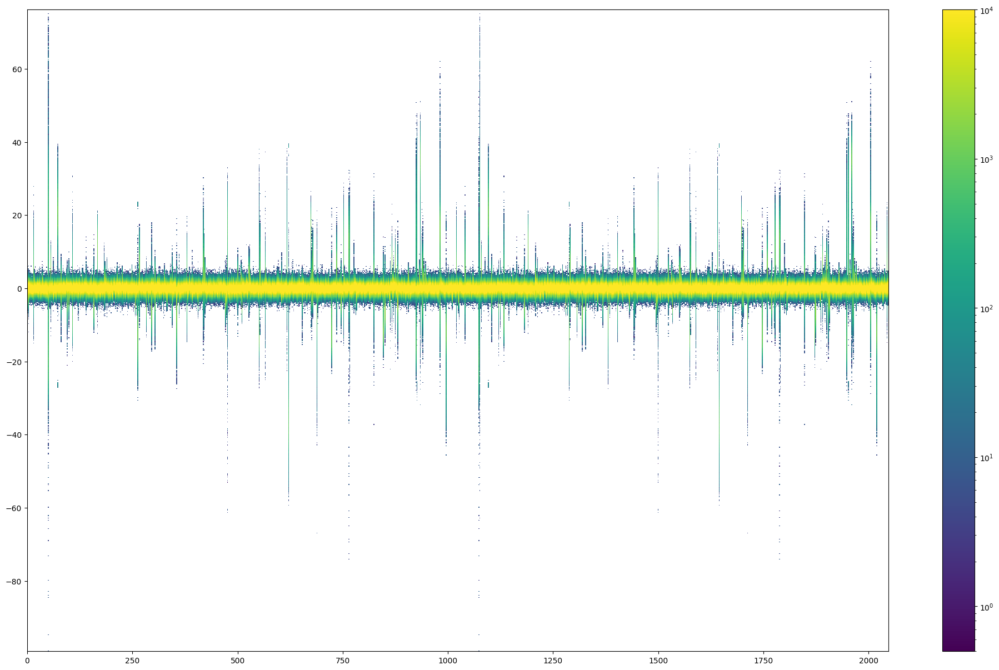

In [58]:
from matplotlib.colors import LogNorm
plt.figure(figsize=(25,15))
plt.hist2d(torch.arange(2048).repeat(train_dataset.informations['embeddings'].shape[0]).cpu(), train_dataset.informations['embeddings'].reshape(-1).cpu(), bins=1000,norm=LogNorm(vmin=0.5, vmax=10000))
plt.colorbar()

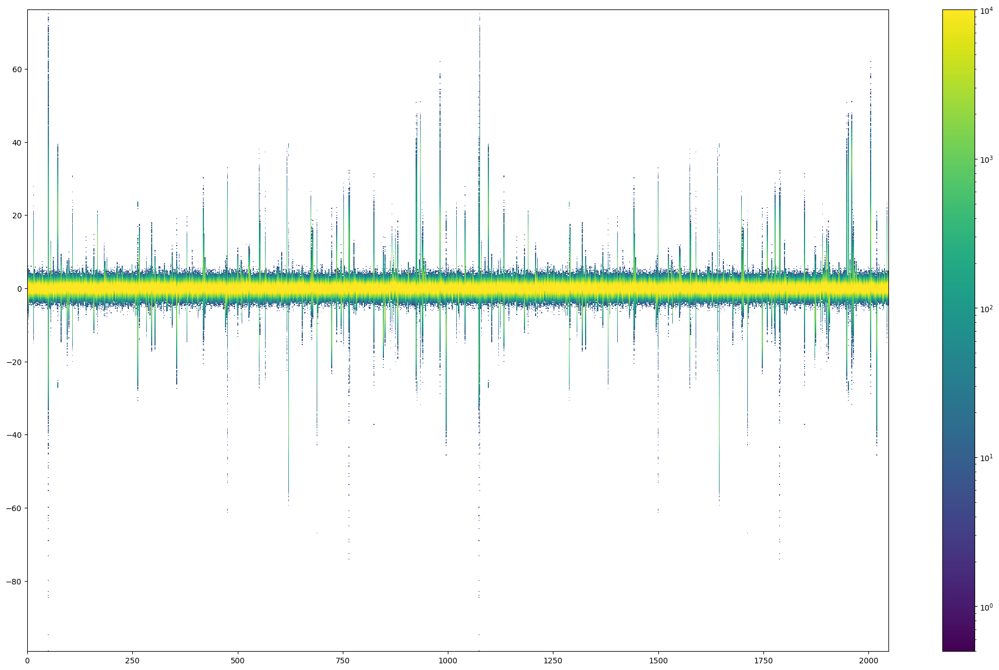

In [59]:
from matplotlib.colors import LogNorm
plt.figure(figsize=(25,15))
plt.hist2d(torch.arange(2048).repeat(train_dataset_set.informations['embeddings'].shape[0]).cpu(), train_dataset_set.informations['embeddings'].reshape(-1).cpu(), bins=1000,norm=LogNorm(vmin=0.5, vmax=10000))
plt.colorbar()

<ErrorbarContainer object of 3 artists>

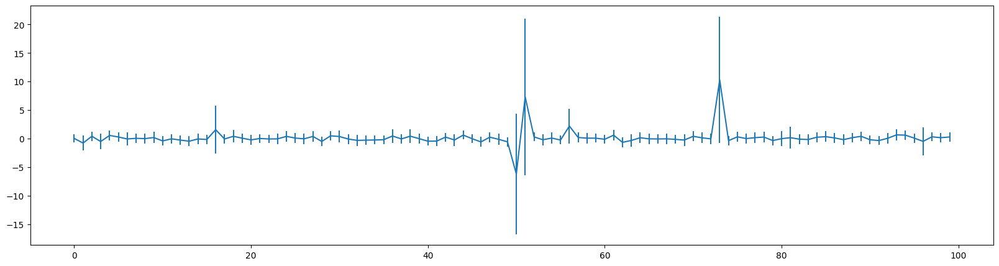

In [33]:
plt.figure(figsize=(20,5))
plt.errorbar(x=np.arange(100),y= train_dataset.informations['embeddings'].mean(dim=0).cpu().numpy()[0:100],yerr= train_dataset.informations['embeddings'].std(dim=0).cpu().numpy()[0:100])

In [38]:
train_dataset_set.informations['embeddings'].shape

torch.Size([156619, 2048])

In [37]:
train_dataset.informations['embeddings'].shape

torch.Size([167492, 2048])

<ErrorbarContainer object of 3 artists>

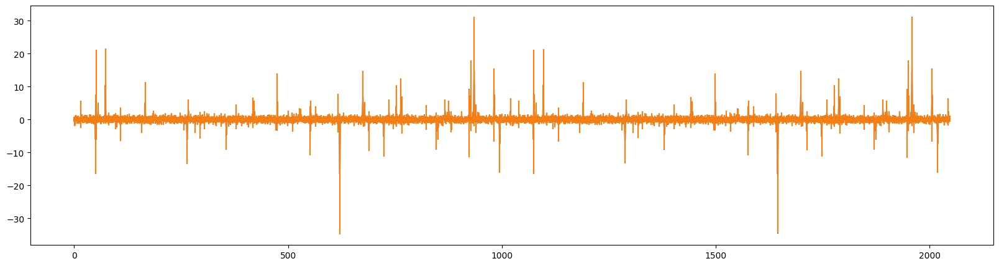

In [61]:
plt.figure(figsize=(20,5))
plt.errorbar(x=np.arange(2048),y= train_dataset_set.informations['embeddings'].mean(dim=0).cpu().numpy()[0:2048],yerr= train_dataset_set.informations['embeddings'].std(dim=0).cpu().numpy()[0:2048])
plt.errorbar(x=np.arange(2048),y= train_dataset.informations['embeddings'].mean(dim=0).cpu().numpy()[0:2048],yerr= train_dataset.informations['embeddings'].std(dim=0).cpu().numpy()[0:2048])

<ErrorbarContainer object of 3 artists>

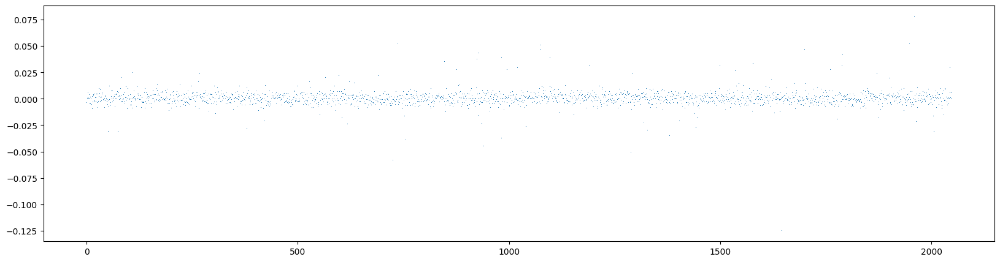

In [70]:
plt.figure(figsize=(20,5))
plt.errorbar(x=np.arange(2048),y= train_dataset_set.informations['embeddings'].mean(dim=0).cpu().numpy()[0:2048]-train_dataset.informations['embeddings'].mean(dim=0).cpu().numpy()[0:2048], fmt=',')#,yerr= train_dataset_set.informations['embeddings'].std(dim=0).cpu().numpy()[0:2048] + train_dataset.informations['embeddings'].std(dim=0).cpu().numpy()[0:2048], fmt=',')
# plt.errorbar(x=np.arange(2048),y= train_dataset.informations['embeddings'].mean(dim=0).cpu().numpy()[0:2048],yerr= train_dataset.informations['embeddings'].std(dim=0).cpu().numpy()[0:2048])

In [47]:
a=train_dataset_set.informations['embeddings'].mean(dim=0)
b=train_dataset    .informations['embeddings'].mean(dim=0)

In [48]:
a.norm()

tensor(51.1562, device='cuda:0', dtype=torch.float16)

In [49]:
b.norm()

tensor(51.0312, device='cuda:0', dtype=torch.float16)

In [51]:
tokenizer('city')

{'input_ids': [2, 8918], 'attention_mask': [1, 1]}

In [50]:
(a-b).norm()

tensor(0.6172, device='cuda:0', dtype=torch.float16)

In [45]:
(train_dataset_set.informations['embeddings'].mean(dim=0).cpu().numpy()-train_dataset.informations['embeddings'].mean(dim=0).cpu().numpy())

AttributeError: 'numpy.ndarray' object has no attribute 'norm'

In [ ]:
(train_dataset_set.informations['embeddings'].mean(dim=0).cpu().numpy()-train_dataset.informations['embeddings'].mean(dim=0).cpu().numpy()).norm()

In [76]:
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
import datetime
import time

# hyperparams = {
#     'lr' : 3e-8,
#     # 'target' : 'logit',        # residual logit or residual probability
#     'target' : 'probability',  
#     'weighted' : True,         # whether to multiply loss with parent probability or not 
#     'optimizer' : 'Adam',
#     'batch_size':  10000
# }

hyperparams = {
    'lr' : 1e-5,
    # 'target' : 'logit',        # residual logit or residual probability
    'target' : 'probability',  
    'weighted' : True,         # whether to multiply loss with parent probability or not 
    'optimizer' : 'SGD',
    'batch_size':  10000,
    'num_clusters' : 1,
    'bias' : True,
}
print("Running experiments on token id", dataset.token_id, test_dataset.token_id, tokenizer.decode(dataset.token_id))
for lr in [1e-5, 2e-5]:
    for num_clusters in [1, 2, 4, 10, 20, 50, 100]:
        hyperparams['lr'] = lr
        hyperparams['num_clusters'] = num_clusters
        torch.manual_seed(0)
        
        if hyperparams['bias']:
            if hyperparams['num_clusters'] == 1 : 
                model = linearlayer_withbias(token_of_interest, 'cuda:0')
            else:
                model = multi_embedding_withbias(token_of_interest, 'cuda:0', number_of_clusters=hyperparams['num_clusters'])
        else:
            if hyperparams['num_clusters'] == 1 : 
                model = linearlayer(token_of_interest, 'cuda:0')
            else:
                model = multi_embedding(token_of_interest, 'cuda:0', number_of_clusters=hyperparams['num_clusters'])
            
        optimizer = optim.SGD(model.parameters(), lr=hyperparams['lr'])#,momentum=0
        #optimizer = optim.Adam(model.parameters(), lr=hyperparams['lr'])
        n_epochs = 300
        experiment_name = "multi_cluster_center10"
        location = f'tensorboard/temporary/{hyperparams["target"]}/{experiment_name}_{hyperparams}'
        location = f'tensorboard/cluster_experiments/{tokenizer.decode(dataset.token_id)}/new_{hyperparams}'
        # location = f'tensorboard/cluster_experiments/digits/new_{hyperparams}'
        writer = SummaryWriter(location)
        
        tall=0
        batch_size=np.minimum(hyperparams['batch_size'], len(dataset))
        
        # loader = torch.utils.data.DataLoader(dataset, batch_size=10000, shuffle=False, collate_fn=collate)
        loop = tqdm(range(n_epochs), desc="Progress")
        train_cache = 0
        test_cache  = 0
        
        for epoch in loop:
            epoch_loss = 0
            # Train loop
            for i in np.arange(len(dataset)/batch_size, dtype=np.int8): 
                start=i*batch_size;
                end  =start+batch_size
                if start==len(dataset): continue
                example_ids=(dataset.informations['example_id'][start:end]  )
                token_pos  =(dataset.informations['positions' ][start:end]  )
                embeddings =(dataset.informations['embeddings'][start:end,:])
                
                token_of_interest_rank =(dataset.informations['ranks' ][start:end]  )
        
                # Get residual probabilities to pass to the model        
                # residual_prob = residual_probs[example_ids.cpu(), token_pos.cpu(), token_of_interest_rank.cpu()]
                residual_prob = residual_probs[example_ids, token_pos, token_of_interest_rank]
        
                # residual_logit = residuals[example_ids, token_pos, token_of_interest_rank]
                
                # if hyperparams['target'] == 'logit':
                #     label = residual_logit
                # else:
                label = residual_prob
        
                # Get teacher probabilities to pass to the model
                if hyperparams['weighted']:
                    # tp = teacher_probs[example_ids.cpu(), token_pos.cpu(), token_of_interest_rank.cpu()]
                    tp = teacher_probs[example_ids, token_pos, token_of_interest_rank]
                    
                else:
                    tp = torch.ones_like(label)    
                
                output, loss = model(embeddings, label.unsqueeze(1)*100, tp.unsqueeze(1))
                if epoch == 0: train_cache += (tp.unsqueeze(1) * torch.abs(label.unsqueeze(1)*100)).sum().item()
                # Batched loss
                loss.mean().backward()
                epoch_loss += loss.sum().item()
                optimizer.step()
            epoch_loss = epoch_loss/(len(dataset))
            if epoch == 0: train_cache /= len(dataset)
            writer.add_scalar('Average Train Loss', epoch_loss/train_cache, epoch)
        
            
            # Validation loop
            with torch.no_grad():
                example_ids=(test_dataset.informations['example_id'])
                token_pos  =(test_dataset.informations['positions' ])
                embeddings =(test_dataset.informations['embeddings'])
                token_of_interest_rank =(test_dataset.informations['ranks' ])
                # Get residual probabilities to pass to the model        
                residual_prob = residual_probs[example_ids, token_pos, token_of_interest_rank]
                # residual_logit = residuals[example_ids, token_pos, token_of_interest_rank]
                
                # if hyperparams['target'] == 'logit':
                #     label = residual_logit
                # else:
                label = residual_prob
        
                # Get teacher probabilities to pass to the model
                if hyperparams['weighted']:
                    tp = teacher_probs[example_ids, token_pos, token_of_interest_rank]
                else:
                    tp = torch.ones_like(label)    
                
                output, loss = model(embeddings, label.unsqueeze(1)*100, tp.unsqueeze(1))
                if epoch == 0: test_cache += (tp.unsqueeze(1) * torch.abs(label.unsqueeze(1)*100)).mean().item()
                # Batched loss
                validation_loss = loss.mean().item()
                writer.add_scalar('Average Validation Loss', validation_loss/test_cache, epoch)
        # print('time',tall)


Running experiments on token id 1142 1142  set


Progress:  18%|███              | 54/300 [00:01<00:08, 28.29it/s]


KeyboardInterrupt: 

In [51]:
len()

156619

In [36]:
tp.device

device(type='cuda', index=0)

## Analyses

In [63]:
ID.shape

torch.Size([28000, 1024])

In [62]:
T_ID.shape

torch.Size([28000, 1024, 10])

In [66]:
((T_ID[...,:i+1].reshape(-1,i+1) == token_of_interest).reshape(-1, 1024, i+1))

torch.Size([28000, 1024, 1])

In [67]:
myind = ((ID[:,0] != 0).reshape(-1, 1, 1).repeat(1, 1024, i+1) * ((T_ID[...,:i+1].reshape(-1,i+1) == token_of_interest).reshape(-1, 1024, i+1))).nonzero()

In [72]:
myind.shape

torch.Size([8474, 3])

In [71]:
(ID[myind[...,0], myind[...,1]] == token_of_interest).sum()

tensor(5071, device='cuda:1')

In [75]:
5071/8927

0.5680519771479781

In [74]:
(ID == token_of_interest).sum()

tensor(8927, device='cuda:1')

In [57]:
i=0
(ID[:,0] != 0).reshape(-1,1).repeat(1, i+1) * T_ID[...,:i+1].reshape(-1,i+1) == token_of_interest

RuntimeError: The size of tensor a (28000) must match the size of tensor b (28672000) at non-singleton dimension 0

In [55]:
for i in range(10):
    (ID[:,0] != 0).reshape(-1,1).repeat(1, i) * T_ID[...,:i+1].reshape(-1,i) == token_of_interest

tensor([[[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False]],

        [[False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         [False, False, False,  ..., False, False, False],
         ...,
         [False, False, False,  ..., False, False, False],
         [

In [54]:
hit_rate_report(token_of_interest)

		OVERALL
top 1 	--- tensor(0.5740, device='cuda:1')
top 2 	--- tensor(0.6690, device='cuda:1')
top 3 	--- tensor(0.7084, device='cuda:1')
top 4 	--- tensor(0.7314, device='cuda:1')
top 5 	--- tensor(0.7477, device='cuda:1')
top 6 	--- tensor(0.7627, device='cuda:1')
top 7 	--- tensor(0.7737, device='cuda:1')
top 8 	--- tensor(0.7823, device='cuda:1')
top 9 	--- tensor(0.7906, device='cuda:1')
top 10 	--- tensor(0.7962, device='cuda:1')

		Train
top 1 	--- tensor(0.5768, device='cuda:1')
top 2 	--- tensor(0.6715, device='cuda:1')
top 3 	--- tensor(0.7111, device='cuda:1')
top 4 	--- tensor(0.7344, device='cuda:1')
top 5 	--- tensor(0.7502, device='cuda:1')
top 6 	--- tensor(0.7650, device='cuda:1')
top 7 	--- tensor(0.7763, device='cuda:1')
top 8 	--- tensor(0.7845, device='cuda:1')
top 9 	--- tensor(0.7931, device='cuda:1')
top 10 	--- tensor(0.7988, device='cuda:1')

		Test
top 1 	--- tensor(0.5489, device='cuda:1')
top 2 	--- tensor(0.6467, device='cuda:1')
top 3 	--- tensor(0.6844,

In [53]:
## Cumulative hit-rate probabilities given Ground truth == token_of_interest
token_of_interest = 7900
def hit_rate_report(token_of_interest=token_of_interest):
    ex_id, tpos = (ID == token_of_interest).nonzero().split(1,dim=-1)
    ex_id, tpos = ex_id.squeeze(), tpos.squeeze()
    my_filter = ex_id < 25000
    print('\t\tOVERALL')
    for rank in range(1, 11): 
        print('top', rank, '\t---', (T_ID[ex_id, tpos].squeeze()[..., :rank] == token_of_interest).sum() / ex_id.shape[0])
    print('\n\t\tTrain')
    for rank in range(1, 11): 
        print('top', rank, '\t---', (T_ID[ex_id[my_filter], tpos[my_filter]].squeeze()[..., :rank] == token_of_interest).sum() / ex_id[my_filter].shape[0])
    print('\n\t\tTest')
    for rank in range(1, 11): 
        print('top', rank, '\t---', (T_ID[ex_id[~my_filter], tpos[~my_filter]].squeeze()[..., :rank] == token_of_interest).sum() / ex_id[~my_filter].shape[0])
def hit_rate_histogram_helper(token_of_interest=token_of_interest):
    ex_id, tpos = (ID == token_of_interest).nonzero().split(1,dim=-1)
    ex_id, tpos = ex_id.squeeze(), tpos.squeeze()
    if len(ex_id.shape) == 0 or 0 in ex_id.shape:
        return [0 for _ in range(10)]
    return [((T_ID[ex_id, tpos].squeeze()[..., :rank] == token_of_interest).sum() / ex_id.shape[0]).item() for rank in range(1, 11)]
def hit_rate_histogram():
    data = np.zeros((256000, 10))
    for i in tqdm(range(256000)):
        token_data = hit_rate_histogram_helper(i)
        data[i] = token_data
    return data
# full_data = hit_rate_histogram()

In [71]:
full_data[digit_ids]

array([[0.77439988, 0.87812662, 0.91157734, 0.9265976 , 0.93602419,
        0.95613867, 0.96055907, 0.96447361, 0.97043604, 0.97391814],
       [0.72949785, 0.8412925 , 0.89376074, 0.9134686 , 0.93449354,
        0.94411707, 0.96066827, 0.96754688, 0.97280926, 0.97685897],
       [0.6017673 , 0.69934255, 0.78125775, 0.83749771, 0.88115317,
        0.90689903, 0.92802531, 0.95560986, 0.96491957, 0.97360665],
       [0.5632866 , 0.64104611, 0.69940865, 0.80076593, 0.85157478,
        0.89445305, 0.92539942, 0.94467443, 0.95917225, 0.97124267],
       [0.55426812, 0.64752555, 0.73747474, 0.78064793, 0.85078144,
        0.89113015, 0.92101502, 0.93736136, 0.95440263, 0.96943128],
       [0.58568871, 0.66508979, 0.70760632, 0.77327722, 0.80482751,
        0.8591522 , 0.90482754, 0.93698877, 0.95757282, 0.96669894],
       [0.52710569, 0.59958005, 0.64167756, 0.69109529, 0.71293879,
        0.74477965, 0.78321284, 0.8591674 , 0.88462502, 0.93574107],
       [0.55289257, 0.63739246, 0.6721101

In [64]:
(ID == 100).nonzero().split(1,dim=-1)[0]

torch.Size([0])

In [52]:
hit_rate_report(100)

		OVERALL
top 1 	--- tensor(nan, device='cuda:1')
top 2 	--- tensor(nan, device='cuda:1')
top 3 	--- tensor(nan, device='cuda:1')
top 4 	--- tensor(nan, device='cuda:1')
top 5 	--- tensor(nan, device='cuda:1')
top 6 	--- tensor(nan, device='cuda:1')
top 7 	--- tensor(nan, device='cuda:1')
top 8 	--- tensor(nan, device='cuda:1')
top 9 	--- tensor(nan, device='cuda:1')
top 10 	--- tensor(nan, device='cuda:1')

		Train
top 1 	--- tensor(nan, device='cuda:1')
top 2 	--- tensor(nan, device='cuda:1')
top 3 	--- tensor(nan, device='cuda:1')
top 4 	--- tensor(nan, device='cuda:1')
top 5 	--- tensor(nan, device='cuda:1')
top 6 	--- tensor(nan, device='cuda:1')
top 7 	--- tensor(nan, device='cuda:1')
top 8 	--- tensor(nan, device='cuda:1')
top 9 	--- tensor(nan, device='cuda:1')
top 10 	--- tensor(nan, device='cuda:1')

		Test
top 1 	--- tensor(nan, device='cuda:1')
top 2 	--- tensor(nan, device='cuda:1')
top 3 	--- tensor(nan, device='cuda:1')
top 4 	--- tensor(nan, device='cuda:1')
top 5 	--- 

<BarContainer object of 256000 artists>

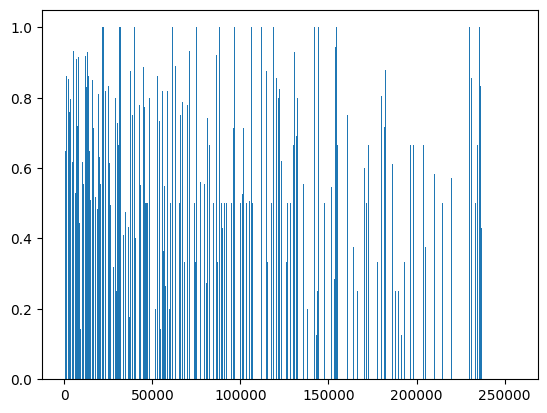

In [27]:
plt.figure()
plt.bar(np.arange(256000), full_data[:, 9])

In [41]:
np.nan_to_num(full_data, 100)

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [37]:
problematic = ((full_data[:, 9] < 0.2) * (full_data[:, 9] > 0)).nonzero()[0]

In [38]:
tokenizer.convert_ids_to_tokens(problematic)

['<0xCE>',
 '<0xDC>',
 '<0xE0>',
 '<0xE5>',
 '<0xE6>',
 '<0xE8>',
 '<0xE9>',
 '▁bec',
 '▁の',
 '▁proble',
 '▁happ',
 '▁commun',
 '▁eas',
 '▁whe',
 '▁ris',
 '▁necess',
 '▁sou',
 '▁wer',
 '▁posi',
 '▁hu',
 '▁wan',
 '▁famili',
 '▁mach',
 'weet',
 'ITEM',
 '▁ens',
 '▁jus',
 '▁Wik',
 '▁creat',
 '▁calcul',
 '▁chall',
 '▁immedi',
 '▁possib',
 '▁administ',
 'Just',
 '▁progra',
 '▁scre',
 '▁Just',
 '▁sty',
 '▁vic',
 '▁objec',
 '▁occas',
 '▁accep',
 '▁Produ',
 'Home',
 '▁neu',
 '▁wea',
 'Did',
 '▁moder',
 'ラン',
 '▁While',
 '▁Most',
 '▁Like',
 '▁Even',
 '▁scienti',
 '▁occup',
 'nah',
 'Discussion',
 'Before',
 '▁proces',
 '▁Prom',
 '▁sli',
 '▁entr',
 'voir',
 'Liter',
 'Fran',
 'Summary',
 '▁dedic',
 'Have',
 '▁Many',
 '▁ah',
 'Many',
 '▁Although',
 '▁foc',
 '▁Have',
 '▁Dav',
 'ynch',
 '▁Because',
 '▁stret',
 '▁Look',
 '▁Tag',
 '▁Requ',
 'While',
 '▁tat',
 'Most',
 '▁Such',
 '▁Did',
 'hibition',
 '▁incl',
 'Was',
 'Identi',
 '▁emphas',
 '▁conj',
 '▁coe',
 'Even',
 'Track',
 '▁According',
 '▁mari',

In [15]:
## Gemma7 per-token loss: Given ground truth == token_of_interest, what is the cross entropy loss of the predictions
loss_fn = torch.nn.CrossEntropyLoss(reduce=False)
locations_train = train_dataset.informations['example_id'], train_dataset.informations['positions'], train_dataset.informations['ranks']
locations_test = test_dataset.informations['example_id'], test_dataset.informations['positions'], test_dataset.informations['ranks']
loss_train= loss_fn(TL[locations_train[0], locations_train[1]], locations_train[2])
loss_test = loss_fn(TL[locations_test[0], locations_test[1]], locations_test[2])
losses = torch.concatenate((loss_train, loss_test), dim=0)

/home/igli/.local/lib/python3.10/site-packages/torch/nn/_reduction.py:42: UserWarning: size_average and reduce args will be deprecated, please use reduction='none' instead.
  warnings.warn(warning.format(ret))


In [67]:
losses

tensor([11.0625,  4.6953,  0.4929,  ...,  3.4199,  5.2812,  3.1367],
       device='cuda:1', dtype=torch.float16)

In [16]:
ALL_GT = ((ID[:,0] != 0).unsqueeze(1) * (ID == token_of_interest)).nonzero().split(1, dim=1)

In [17]:
ALL_GT[0].shape

torch.Size([7842, 1])

In [74]:
hits[:,0]

tensor([   0,    1,    2,  ..., 7839, 7840, 7841], device='cuda:1')

In [75]:
TL[hits[:,0]].squeeze().shape

torch.Size([7018, 1024, 10])

In [18]:
misses = (T_ID[ALL_GT[0], ALL_GT[1]].squeeze() != token_of_interest).all(dim=1).nonzero().squeeze()

In [19]:
ID[ALL_GT[0][misses].squeeze(), ALL_GT[1][misses].squeeze()]

tensor([7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900, 7900,
        7900, 7900, 7900, 7900, 7900, 79

In [54]:
all_ranks = torch.zeros(ALL_GT[0].shape[0], device=device).long()

In [55]:
hits = (T_ID[ALL_GT[0].squeeze(), ALL_GT[1].squeeze()] == token_of_interest).nonzero()

In [56]:
all_ranks[hits[:,0]] = hits[:,1]

In [57]:
all_ranks[misses.cpu()] = 10

In [59]:
all_ranks.shape

torch.Size([7842])

In [49]:
hits.shape, ALL_GT[0].shape

(torch.Size([7018, 2]), torch.Size([7842, 1]))

In [61]:
np.log(256000-10)

12.45289366019874

In [34]:
(T_ID[ALL_GT[0], ALL_GT[1]] != token_of_interest).all(dim=-1).nonzero()

tensor([[  34,    0],
        [  38,    0],
        [  58,    0],
        ...,
        [7804,    0],
        [7819,    0],
        [7824,    0]], device='cuda:1')

In [32]:
all_ranks = T_ID[ALL_GT[0], ALL_GT[1]]

torch.Size([7842, 1])

In [29]:
T_ID[ALL_GT[0].squeeze(), ALL_GT[1].squeeze()][1]

tensor([  7900, 235290,  34492,   5358,    108,  32885,  72691,  67837,  26480,
         14845], device='cuda:1', dtype=torch.int32)

In [20]:
torch.log_softmax(TL[ALL_GT[0][misses].squeeze(), ALL_GT[1][misses].squeeze()], dim=-1).min()

tensor(-8.5156, device='cuda:1', dtype=torch.float16)

Maybe we should set constant to something higher?

In [21]:
misses.shape

torch.Size([824])

In [22]:
TL.shape

torch.Size([28000, 1024, 10])

In [84]:
loss_fn(torch.log_softmax(torch.concatenate((TL[ALL_GT[0][misses].squeeze(), ALL_GT[1][misses].squeeze()], TL[ALL_GT[0][misses].squeeze(), ALL_GT[1][misses].squeeze()].min(dim=-1).values.unsqueeze(1)*4), dim=-1), dim=-1), all_ranks[misses])

tensor([7.9550e+02, 4.6100e+02, -0.0000e+00, 4.7825e+02, 6.0700e+02, 7.3050e+02,
        4.5250e+02, -0.0000e+00, 4.5600e+02, 4.4344e+01, 4.0000e+02, -0.0000e+00,
        2.3750e+02, 7.0850e+02, 4.8225e+02, 6.1650e+02, -0.0000e+00, 4.8450e+02,
        7.0650e+02, -0.0000e+00, 1.3461e+01, 1.2588e+02, -0.0000e+00, 5.3250e+02,
        -0.0000e+00, 7.5750e+02, 3.1500e+02, -0.0000e+00, -0.0000e+00, 4.4700e+02,
        -0.0000e+00, 5.5050e+02, -0.0000e+00, 3.5925e+02, 6.9150e+02, 2.9475e+02,
        -0.0000e+00, 5.6850e+02, -0.0000e+00, 7.7200e+02, 2.4275e+02, 7.6950e+02,
        7.7900e+02, 7.4650e+02, 1.7715e-04, -0.0000e+00, 7.6350e+02, 1.5650e+02,
        2.0212e+02, 6.6850e+02, 1.0381e+02, -0.0000e+00, 4.6275e+02, 5.9100e+02,
        4.9150e+02, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00, -0.0000e+00,
        -0.0000e+00, 8.0300e+02, 6.2950e+02, -0.0000e+00, 7.3000e+02, 1.1921e-07,
        8.0050e+02, 6.4950e+02, -0.0000e+00, -0.0000e+00, -0.0000e+00, 2.7575e+02,
        -0.0000

In [64]:
min_teacher_logits = TL[ALL_GT[0][misses].squeeze(), ALL_GT[1][misses].squeeze()].min(dim=-1).values

In [71]:
torch.log_softmax(torch.concatenate((TL[ALL_GT[0][misses].squeeze(), ALL_GT[1][misses].squeeze()], min_teacher_logits.unsqueeze(1).repeat(1,256000-10)), dim=1), dim=1).min()

tensor(-12.4688, device='cuda:1', dtype=torch.float16)

In [55]:
torch.tensor(10).repeat(824).shape

torch.Size([824])

In [37]:
tokenizer.convert_ids_to_tokens(digit_ids)

['1', '2', '3', '4', '5', '6', '7', '8', '9', '0']

In [50]:
for i in range(1,11):
    print(f"\tInformation for digit {i%10}")
    hit_rate_report(digit_ids[i-1])

	Information for digit 1
		OVERALL
top 1 	--- tensor(0.7744, device='cuda:1')
top 2 	--- tensor(0.8781, device='cuda:1')
top 3 	--- tensor(0.9116, device='cuda:1')
top 4 	--- tensor(0.9266, device='cuda:1')
top 5 	--- tensor(0.9360, device='cuda:1')
top 6 	--- tensor(0.9561, device='cuda:1')
top 7 	--- tensor(0.9606, device='cuda:1')
top 8 	--- tensor(0.9645, device='cuda:1')
top 9 	--- tensor(0.9704, device='cuda:1')
top 10 	--- tensor(0.9739, device='cuda:1')

		Train
top 1 	--- tensor(0.7743, device='cuda:1')
top 2 	--- tensor(0.8782, device='cuda:1')
top 3 	--- tensor(0.9116, device='cuda:1')
top 4 	--- tensor(0.9266, device='cuda:1')
top 5 	--- tensor(0.9361, device='cuda:1')
top 6 	--- tensor(0.9561, device='cuda:1')
top 7 	--- tensor(0.9606, device='cuda:1')
top 8 	--- tensor(0.9645, device='cuda:1')
top 9 	--- tensor(0.9704, device='cuda:1')
top 10 	--- tensor(0.9738, device='cuda:1')

		Test
top 1 	--- tensor(0.7753, device='cuda:1')
top 2 	--- tensor(0.8774, device='cuda:1')


Significant difficulty in predicting digits 5 and 7 (?)